In [289]:
%matplotlib inline
import numpy as np
from pylab import *
import matplotlib
from scipy import stats
import re
import math
import astropy as astro
import scipy.ndimage as spimage
from astropy.io import fits, ascii
from astropy.table import Table, join
from astropy.cosmology import WMAP9 as cosmo
import matplotlib as mpl
import matplotlib.cm as cm

from scipy import optimize
from scipy.stats import gaussian_kde
from matplotlib import colors
import scipy.ndimage as ndimage
from collections import Counter
from matplotlib.legend import Legend
import matplotlib.patches as patches
from matplotlib import pyplot
#
#
#
import extinction


#
# seaborn
#
import seaborn as sns

#
# Jorge
#
from sel2dhist_xy import sel2dhist_xy


#
# 3D plots!
#
import numpy as np
import scipy.linalg
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

#biweight_midvariance


import warnings
warnings.simplefilter("ignore")

#
# my_utils
#
from my_utils import *

#
#
#
#from ndtest import *
#from sklearn.decomposition import PCA

#
#
#
from scipy.optimize import leastsq, fmin
import matplotlib.animation as animation

#
# Carlos Color map
#
from cmaps_CLC import vel_map

#from astropy.cosmology import FlatLambdaCDM

In [290]:
from astroquery.irsa import Irsa
import astropy.units as u
from astropy.table import hstack as tab_hstack
from astropy.coordinates import SkyCoord
from mpl_toolkits import axes_grid1
from astropy.cosmology import FlatLambdaCDM

In [291]:
from matplotlib import rcParams as rc
rc.update({'font.size': 22,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 22,\
           'ytick.labelsize' : 22,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })

conts=[0.99,0.85,0.6,0.15,0.01]


In [292]:
#import numpy as np
from scipy.stats import kstest

def ks_2d_2s(data1, data2):
    """
    Perform a 2D Kolmogorov-Smirnov test to compare two 2D distributions.

    Parameters:
        data1: np.ndarray
            2D array of shape (N1, 2), representing the first sample.
        data2: np.ndarray
            2D array of shape (N2, 2), representing the second sample.

    Returns:
        D: float
            KS statistic for the 2D test.
        p_value: float
            Corresponding p-value of the test.
    """

    def empirical_cdf(data, x, y):
        """Calculate the empirical CDF for 2D data."""
        return np.sum((data[:, 0] <= x) & (data[:, 1] <= y)) / len(data)

    # Combine all x and y values from both distributions
    combined_x = np.concatenate([data1[:, 0], data2[:, 0]])
    combined_y = np.concatenate([data1[:, 1], data2[:, 1]])

    # Evaluate CDF differences on combined grid
    max_diff = 0
    for x in combined_x:
        for y in combined_y:
            cdf1 = empirical_cdf(data1, x, y)
            cdf2 = empirical_cdf(data2, x, y)
            diff = abs(cdf1 - cdf2)
            max_diff = max(max_diff, diff)

    # KS statistic is the maximum difference
    D = max_diff

    # Compute approximate p-value
    # For simplicity, use a bootstrap method or assume a normal approximation.
    n1, n2 = len(data1), len(data2)
    n_eff = (n1 * n2) / (n1 + n2)  # Effective sample size
    p_value = np.exp(-2 * (n_eff * D**2))

    return D, p_value


#import numpy as np
from scipy.spatial import cKDTree

def KS2DF(data1, data2):
    """
    Perform the 2D Kolmogorov-Smirnov test using the Fasano-Franceschini method.

    Parameters:
    data1, data2 : array_like
        Two datasets to compare, each with shape (n_samples, 2).

    Returns:
    D : float
        The KS statistic.
    p_value : float
        The p-value for the test.
    """
    n1 = len(data1)
    n2 = len(data2)
    data_all = np.vstack([data1, data2])
    tree = cKDTree(data_all)

    def count_points_in_quadrant(point, data):
        """
        Count the number of points in each quadrant relative to the given point.
        """
        x, y = point
        q1 = np.sum((data[:, 0] >= x) & (data[:, 1] >= y))
        q2 = np.sum((data[:, 0] < x) & (data[:, 1] >= y))
        q3 = np.sum((data[:, 0] < x) & (data[:, 1] < y))
        q4 = np.sum((data[:, 0] >= x) & (data[:, 1] < y))
        return np.array([q1, q2, q3, q4])

    D = 0
    for point in data_all:
        n1_quad = count_points_in_quadrant(point, data1)
        n2_quad = count_points_in_quadrant(point, data2)
        D = max(D, np.max(np.abs(n1_quad / n1 - n2_quad / n2)))

    D *= np.sqrt(n1 * n2 / (n1 + n2))

    # Approximate p-value (for large samples, this approximation is reasonable)
    p_value = np.exp(-2 * D**2)

    return D, p_value

# Example usage:
#np.random.seed(0)
#KS2DF(data1, data2)
#data1 = np.random.normal(0, 1, size=(100, 2))
#data2 = np.random.normal(0.5, 1, size=(100, 2))

#D, p_value = fasano_franceschini_test(data1, data2)
#print(f"KS Statistic: {D}")
#print(f"P-value: {p_value}")



# Example usage
#np.random.seed(42)
#data1 = np.random.normal(size=(100, 2))  # First sample: 2D normal distribution
#data2 = np.random.normal(loc=0.5, size=(100, 2))  # Second sample: shifted 2D normal distribution

# Perform 2D KS test
#D, p_value = ks_2d_2s(data1, data2)
#print(f"2D KS Statistic: {D}")
#print(f"P-value: {p_value}")


In [293]:
#data1.shape

In [294]:
#                        FUNCTIONS
######################################################################

# Medians at bin with fixed size. 
def med(x,y,A):
    
    bin1 , min1 , max1= A[0], A[1], A[2] 
    
    x_range    = np.arange(min1,max1,bin1)
    y1_binM    = np.zeros(x_range.size)
    y1_binD    = np.zeros(x_range.size)

    for i, val  in enumerate(x_range):
        tmp = (x >= val) & (x <= val+bin1)
        y1_binM[i]   = np.median(y[tmp])
        y1_binD[i]   = np.std   (y[tmp])
        
    return(x_range+0.5*bin1, y1_binM, y1_binD)
######################################################################

# Extinction Function # References for this function?
def A_l(Rv,l):
    l=l/10000.; #Amstrongs to Microns
    x=1/l
    if x > 1.1:
        y=(x-1.82)
        ax=1+0.17699*y-0.50447*y**2-0.02427*y**3+0.72085*y**4+0.01979*y**5-0.77530*y**6+0.32999*y**7
        bx=1.41338*y+2.28305*y**2+1.07233*y**3-5.38434*y**4-0.62251*y**5+5.30260*y**6-2.09002*y**7
    else:
        ax=0.574*x**1.61
        bx=-0.527*x**1.61
    Arat=ax+bx/Rv
    return Arat
##################################################################

# Model linear function 
def model_lin(params, x):
    a,b= params    
    y = a*x + b
    return y

# Function to minimize for model_lin
def fun_lin(params, x, y_data):
    return y_data - model_lin(params, x)

###############################################################
def pseud_ODR_linear(x,y):
    from numpy import ones,vstack
    from numpy.linalg import lstsq
    
    funct = lambda x,a,b: a + b*x 
    START = [0,1]
    
    #Fit x,y 
    par, cov   = optimize.curve_fit(funct, x, y, p0=START)
    a, b = par[0], par[1]
    #Fit y,x  
    par, cov   = optimize.curve_fit(funct, y, x, p0=START)
    c, d = par[0], par[1]
    
    #Common Point
    x1 = (a + c/d)/ (-b+1/d) 
    y1 = a+b*x1
    
    #x=0 point
    x0 = 0.0
    if a > -c/d: 
        y0 = -c/d+ 0.5*(a-(-c/d)) 
    else: 
        y0 = 0.5*(-(c/d)-a)
        
    dy = (y1 - y0)
    dx = (x1 - x0) 
    m  = dy/dx 
    c  = y0
    
    return(x0, y0, x1, y1, m, c)

def xy2hist(xarr, yarr, log=True, bins=[100,100]):
    if log:
        x = np.log10(xarr)
        y = np.log10(yarr)
    else:
        x = xarr
        y = yarr
    # Histogram the data
    # https://stackoverflow.com/questions/49662964/density-scatter-plot-for-huge-dataset-in-matplotlib
    hh, locx, locy = np.histogram2d(x, y, bins=bins)
    # Get the bin value for each point
    z = np.array([hh[np.argmax(a<=locx[1:]),np.argmax(b<=locy[1:])] for a,b in zip(x,y)])
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    if log:
        z = np.log10(z)
    return x, y, z, hh, locx, locy

def add_colorbar(im, aspect=20, pad_fraction=0.5, **kwargs):
    """Add a vertical color bar to an image plot."""
    divider = axes_grid1.make_axes_locatable(im.axes)
    width = axes_grid1.axes_size.AxesY(im.axes, aspect=1./aspect)
    pad = axes_grid1.axes_size.Fraction(pad_fraction, width)
    current_ax = plt.gca()
    cax = divider.append_axes("right", size=width, pad=pad)
    plt.sca(current_ax)
    return im.axes.figure.colorbar(im, cax=cax, **kwargs)


In [295]:
dir_tab = 'tables'

def search_col(tab,key):
    for cols in tab.columns:
        if (cols.find(key)>-1):
            print(cols)



In [296]:
# Cosmology

h = 0.71
o_m = 0.27
o_l = 0.73




In [297]:
hdu_nsa_mpa_XMM = fits.open(f'{dir_tab}/nsa_mpa_jhu_XMM.fits')
tab_nsa_mpa_XMM = Table(hdu_nsa_mpa_XMM[1].data)
list_columns(tab_nsa_mpa_XMM.columns,6)

IAUNAME_1               LICK_CA4227             BH_MH                   OIII_4959_CONT_ERR      STACK_FLAG              PN_2_EXP                
SUBDIR                  LICK_CA4227_ERR         BH_MH_ERR               OIII_4959_REQW          EP_FLAG                 PN_3_EXP                
RA_1                    LICK_CA4227_MODEL       BH_MH_MODEL             OIII_4959_REQW_ERR      PN_FLAG                 PN_4_EXP                
DEC_1                   LICK_CA4227_SUB         BH_MH_SUB               OIII_4959_EQW           M1_FLAG                 PN_5_EXP                
ISDSS                   LICK_CA4227_SUB_ERR     BH_MH_SUB_ERR           OIII_4959_EQW_ERR       M2_FLAG                 M1_EXP                  
INED                    LICK_G4300              BH_FC                   OIII_4959_SEQW          IAUNAME_DETCAT          M1_1_EXP                
ISIXDF                  LICK_G4300_ERR          BH_FC_ERR               OIII_4959_SEQW_ERR      SRCID_DETCAT            M1_2_EXP  

In [298]:
specobjid_xmm = tab_nsa_mpa_XMM['SPECOBJID']

In [299]:
#
# Appart from matches, we need to select the AGNs
#
#cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

# Extract necessary columns
#flux_hx = tab_nsa_mpa_XMM['PN_2_FLUX']  # or 'EP_2_FLUX' depending on the source
flux_hx = tab_nsa_mpa_XMM['EP_4_FLUX'] + tab_nsa_mpa_XMM['EP_5_FLUX'] # 2-12 keV
flux_sx = tab_nsa_mpa_XMM['EP_1_FLUX'] + tab_nsa_mpa_XMM['EP_2_FLUX'] + tab_nsa_mpa_XMM['EP_3_FLUX'] 
# 0.2 - 2 keV

#+ tab_nsa_mpa_XMM['EP_3_FLUX'] #+ tab_nsa_mpa_XMM['EP_4_FLUX']    
#flux_sx = tab_nsa_mpa_XMM['PN_1_FLUX']  # 0.5-2 keV

# Compute hardness ratio
HR = (flux_hx - flux_sx) / (flux_hx + flux_sx)
# or 'EP_2_FLUX' depending on the source
#redshift = tab_nsa_mpa_XMM['REDSHIFT']  # Assuming redshift is available
redshift_xmm = tab_nsa_mpa_XMM['Z_2']

# Calculate luminosity distance (d_L) in cm
# K corr
# Photon index for K-correction (default value; adjust if needed)
Gamma = 1.8
K_corr = (1 + redshift_xmm)**(Gamma - 2)

d_L = cosmo.luminosity_distance(redshift_xmm).to('cm')*K_corr

# Calculate LHX (erg/s)
L_HX = 4 * np.pi * (d_L**2) * flux_hx #* (1+redshift_xmm)**2

# Add LHX to the table
tab_nsa_mpa_XMM['L_HX'] = L_HX
tab_nsa_mpa_XMM['HR'] = HR

#e_EW_Ha = tab_nsa_mpa_XMM['H_ALPHA_EQW_ERR'] #/ tab_nsa_mpa['H_ALPHA_CONT']#tab_nsa_mpa['H_ALPHA_FLUX_ERR'] / tab_nsa_mpa['H_ALPHA_CONT']




In [300]:
#tab_nsa_mpa_XMM['']

In [302]:
nanomaggies_r = np.array(tab_nsa_mpa_XMM['ELPETRO_FLUX'][:,4])  # SDSS r-band nanomaggies

# Constants for flux conversion
zero_point_flux = 3.631e-6  * 1e-23 # Zero-point flux density in erg/cm^2/s/Hz
lambda_r = 6231  # SDSS r-band central wavelength in Å
c = 2.998e18  # Speed of light in Å/s

F_nu = nanomaggies_r * zero_point_flux

# Convert nanomaggies to flux in erg/cm^2/s
delta_lambda_r = 1370
F_opt = F_nu * ( c / lambda_r**2) # * delta_lambda_r

print(nanomaggies_r[0:3])
print(F_nu[0:3])
print(F_opt[0:3])

# Compute X/O ratio
X_O = np.log10(flux_hx / F_opt)
tab_nsa_mpa_XMM['X_O'] = X_O
print(len(X_O))

[119.11817 434.90894 461.12515]
[4.3251807e-27 1.5791544e-26 1.6743454e-26]
[3.3397996e-16 1.2193847e-15 1.2928889e-15]
1414


In [264]:
#plt.scatter(F_opt,flux_hx)

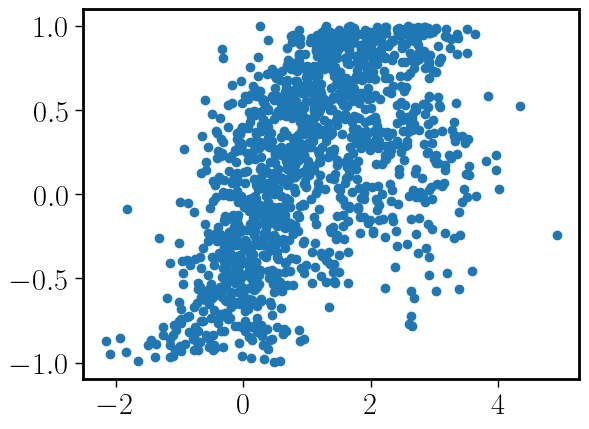

In [265]:
plt.scatter(tab_nsa_mpa_XMM['X_O'],tab_nsa_mpa_XMM['HR'])
#plt.scatter(nanomaggies_r,F_opt)
#plt.scatter(np.array(nanomaggies_r),F_opt)
#plt.scatter(tab_nsa_mpa_XMM['X_O'],tab_nsa_mpa_XMM['HR'])
#plt.plot([0,0.2],[41,41],color='k')


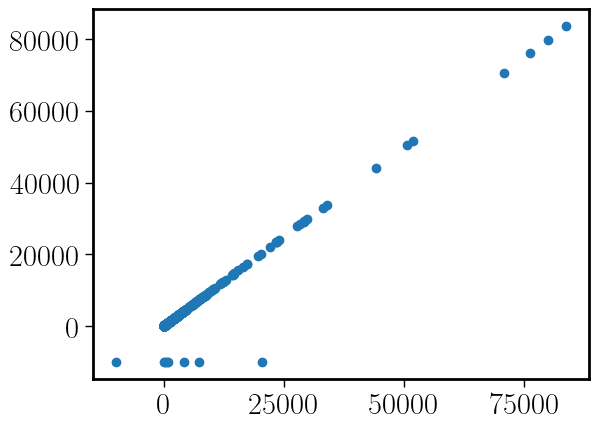

In [266]:
plt.scatter(tab_nsa_mpa_XMM['ELPETRO_FLUX'][:,4],tab_nsa_mpa_XMM['ELPETRO_FLUX_R'])

In [267]:
tab_nsa_mpa_XMM['ELPETRO_FLUX'][:,4]

119.11817
434.90894
461.12515
587.3104
169.93617
861.53705
216.8954
...
2008.507
71.9828
1773.2317


ValueError: operands could not be broadcast together with shapes (1414,) (547935,) 

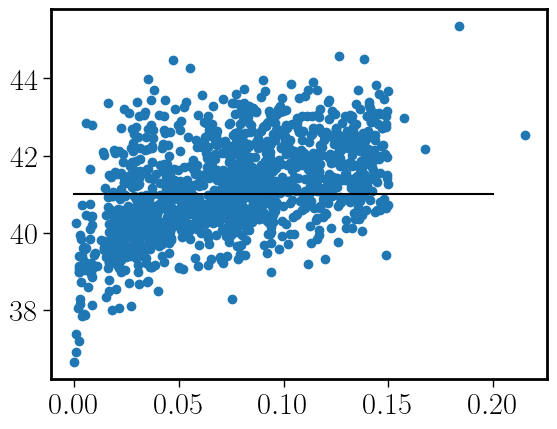

In [288]:
plt.scatter(tab_nsa_mpa_XMM['Z_2'],np.log10(tab_nsa_mpa_XMM['L_HX']))
plt.plot([0,0.2],[41,41],color='k')

#
# Standard values
#

#LX_lim = 41
#HR_lim = -0.2

#
# Strict selection
#

LX_lim = 42
HR_lim = 0.0


mask_XMM_AGNs = (np.log10(tab_nsa_mpa_XMM['L_HX']) > LX_lim) & (HR > HR_lim) & (HR != 1.0)
plt.scatter(tab_nsa_mpa_XMM['Z_2'][mask_XMM_AGNs],np.log10(tab_nsa_mpa_XMM['L_HX'][mask_XMM_AGNs]),\
            color='None',edgecolor='k')

print(len(tab_nsa_mpa_XMM['Z_2'][mask_XMM_AGNs]))
print(len(tab_nsa_mpa_XMM['Z_2']))
#print(len(tab_nsa_mpa_XMM['Z_2'][mask_XMM_AGNs]))


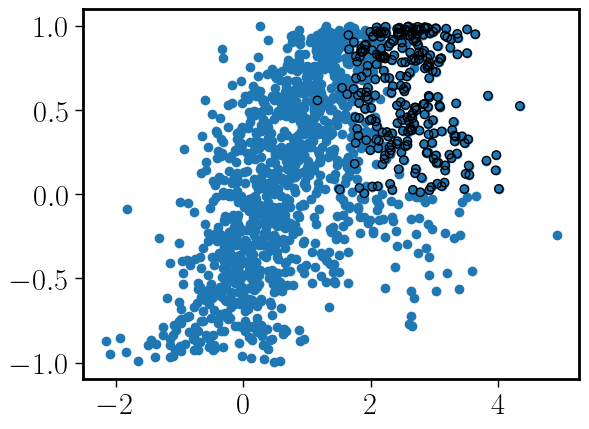

In [269]:
plt.scatter(tab_nsa_mpa_XMM['X_O'],tab_nsa_mpa_XMM['HR'])
# [mask_XMM_AGNs]
plt.scatter(tab_nsa_mpa_XMM['X_O'][mask_XMM_AGNs],tab_nsa_mpa_XMM['HR'][mask_XMM_AGNs],color='None',edgecolor='k')

In [270]:
hdu_nsa_mpa = fits.open(f'{dir_tab}/nsa_mpa_jhu.fits')
#hdu_eR.info()
tab_nsa_mpa = Table(hdu_nsa_mpa[1].data)
list_columns(tab_nsa_mpa.columns,6)

IAUNAME                 ELPETRO_B1000           LICK_MG2_SUB_ERR        BH_HB_ERR               OII_3729_SEQW           OI_6300_EQW_ERR         
SUBDIR                  ELPETRO_METS            LICK_MGB                BH_HB_MODEL             OII_3729_SEQW_ERR       OI_6300_SEQW            
RA_1                    IN_DR7_LSS              LICK_MGB_ERR            BH_HB_SUB               OII_3729_FLUX           OI_6300_SEQW_ERR        
DEC_1                   SPECOBJID               LICK_MGB_MODEL          BH_HB_SUB_ERR           OII_3729_FLUX_ERR       OI_6300_FLUX            
ISDSS                   PLATEID                 LICK_MGB_SUB            BH_MGG                  OII_3729_INST_RES       OI_6300_FLUX_ERR        
INED                    MJD_2                   LICK_MGB_SUB_ERR        BH_MGG_ERR              OII_3729_CHISQ          OI_6300_INST_RES        
ISIXDF                  FIBERID_2               LICK_FE5270             BH_MGG_MODEL            NEIII_3869_CONT         OI_6300_CH

In [271]:
#
# Appart from matches, we need to select the AGNs
#

specobjid_xmm = tab_nsa_mpa_XMM['SPECOBJID'][mask_XMM_AGNs]
print(len(specobjid_xmm))
mask_XMM = mask = np.isin(tab_nsa_mpa['SPECOBJID'], specobjid_xmm)
print(len(mask_XMM))



# Assuming L_HX and HR were initialized properly


tab_nsa_mpa['L_HX'] = np.nan
tab_nsa_mpa['HR'] = np.nan
tab_nsa_mpa['X_O'] = np.nan

L_HX = np.array(tab_nsa_mpa['L_HX'])
HR = np.array(tab_nsa_mpa['HR'])
XO = np.array(tab_nsa_mpa['X_O'])


# Example: Assign calculated values to L_HX and HR
for idx, row in enumerate(tab_nsa_mpa):
    mask_objid = tab_nsa_mpa_XMM['SPECOBJID'] == row['SPECOBJID']
    if np.any(mask_objid):
        L_HX[idx] = tab_nsa_mpa_XMM['L_HX'][mask_objid]
        HR[idx] = tab_nsa_mpa_XMM['HR'][mask_objid]
        XO[idx] = tab_nsa_mpa_XMM['X_O'][mask_objid]

tab_nsa_mpa['L_HX'] = L_HX
tab_nsa_mpa['HR'] = HR
tab_nsa_mpa['X_O'] = XO



mask_XMM_AGNs = (np.log10(tab_nsa_mpa_XMM['L_HX']) > LX_lim) & (tab_nsa_mpa_XMM['HR'] > HR_lim)

#masked_tab = tab_nsa_mpa[mask_XMM]
#(tab_nsa_mpa['SPECOBJID'] == specobjid_xmm)

tab_nsa_mpa['L_HX','HR'][mask_XMM]

266
547935


L_HX,HR
float64,float64
2.9719947053820637e+42,0.9655521512031555
1.7027960468286578e+43,0.9915169477462769
3.753414618723616e+43,0.5863991975784302
7.298246842554926e+42,0.9287805557250977
1.3225678076992279e+42,0.5643673539161682
...,...
4.693078322654761e+43,0.8388376235961914
8.898726986643232e+43,0.23315832018852234
1.0450777581776425e+43,0.0429016649723053


In [272]:
search_col(tab_nsa_mpa,'ELPETRO')

ELPETRO_BA
ELPETRO_PHI
ELPETRO_FLUX_R
ELPETRO_FLUX_IVAR_R
ELPETRO_THETA_R
ELPETRO_TH50_R
ELPETRO_TH90_R
ELPETRO_THETA
ELPETRO_FLUX
ELPETRO_FLUX_IVAR
ELPETRO_TH50
ELPETRO_TH90
ELPETRO_APCORR_R
ELPETRO_APCORR
ELPETRO_APCORR_SELF
ELPETRO_NMGY
ELPETRO_NMGY_IVAR
ELPETRO_OK
ELPETRO_RNMGY
ELPETRO_ABSMAG
ELPETRO_AMIVAR
ELPETRO_KCORRECT
ELPETRO_KCOEFF
ELPETRO_MASS
ELPETRO_MTOL
ELPETRO_B300
ELPETRO_B1000
ELPETRO_METS


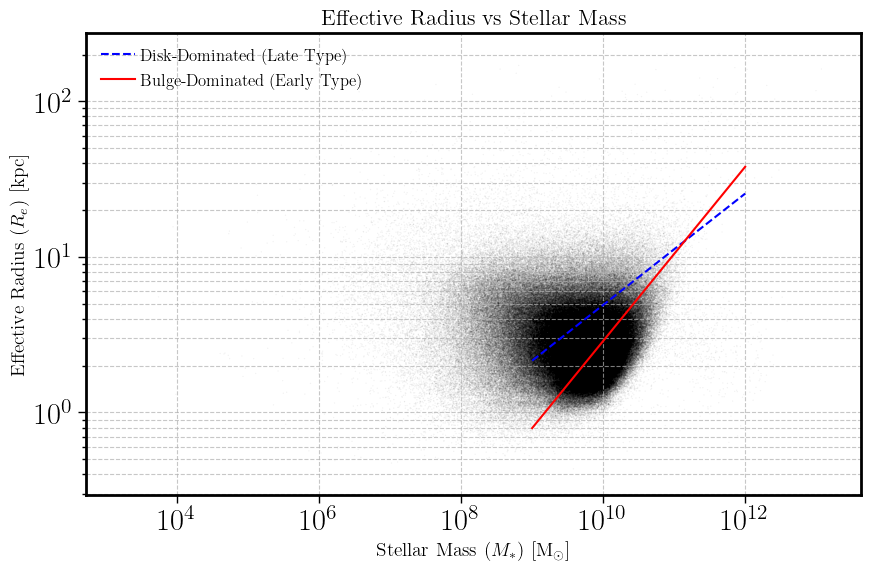

[ 2.15318573  2.20764876  2.26348938  2.32074245  2.37944369  2.43962973
  2.50133812  2.56460737  2.62947697  2.69598739  2.76418013  2.83409775
  2.90578388  2.97928325  3.05464173  3.13190633  3.21112528  3.29234801
  3.37562519  3.46100881  3.54855213  3.63830978  3.73033778  3.82469355
  3.92143597  4.02062541  4.12232377  4.22659449  4.33350266  4.44311499
  4.55549986  4.67072741  4.78886955  4.91        5.03419434  5.16153007
  5.29208665  5.42594555  5.5631903   5.70390654  5.84818209  5.99610695
  6.14777346  6.30327624  6.46271234  6.62618124  6.79378494  6.96562804
  7.14181777  7.32246408  7.50767967  7.69758015  7.89228399  8.09191271
  8.29659086  8.50644618  8.72160962  8.94221543  9.16840128  9.40030832
  9.63808125  9.88186844 10.13182203 10.38809799 10.65085623 10.92026072
 11.19647957 11.47968515 11.77005418 12.06776784 12.37301193 12.6859769
 13.00685807 13.33585565 13.67317496 14.01902647 14.37362601 14.73719484
 15.10995985 15.49215363 15.88401469 16.28578754 16.

In [273]:
stellar_mass = np.logspace(9, 12, 100)  # Stellar mass in solar masses



# Empirical relations for Re vs M* (from Shen et al. 2003)
#R_disk = 3.1 * (stellar_mass / 1e10)**0.35  # Effective radius for disk galaxies (in kpc)
#R_bulge = 2.5 * (stellar_mass / 1e10)**0.56  # Effective radius for bulge galaxies (in kpc)
R_disk = 4.91 * (stellar_mass / 1e10)**0.358  # Effective radius for disk galaxies (kpc)
R_bulge = 2.88 * (stellar_mass / 1e10)**0.56  # Effective radius for bulge galaxies (kpc)

# Plot the data
plt.figure(figsize=(10, 6))

plt.scatter(tab_nsa_mpa['SERSIC_MASS']*(0.71**2)/1.68,\
            tab_nsa_mpa['ELPETRO_TH50_R'],edgecolor='None',color='k',s=1,alpha=0.05)#,masterized='True')
plt.loglog(stellar_mass, R_disk, label='Disk-Dominated (Late Type)', color='blue', linestyle='--')
plt.loglog(stellar_mass, R_bulge, label='Bulge-Dominated (Early Type)', color='red', linestyle='-')
plt.xlabel('Stellar Mass ($M_*$) [M$_\odot$]', fontsize=14)
plt.ylabel('Effective Radius ($R_e$) [kpc]', fontsize=14)
plt.title('Effective Radius vs Stellar Mass', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, which='both', linestyle='--', alpha=0.7)
plt.show()

print(R_disk)

plt.scatter(tab_nsa_mpa['Z_1'],tab_nsa_mpa['Z_2'],alpha=0.05,edgecolor='None')
plt.xlim(0,1)


plt.scatter(tab_nsa_mpa['H_ALPHA_FLUX'],tab_nsa_mpa['SIGMA_BALMER'],alpha=0.05,edgecolor='None')
plt.xlim(0,10000)

plt.scatter(tab_nsa_mpa['H_ALPHA_INST_RES'],tab_nsa_mpa['SIGMA_BALMER'],alpha=0.05,edgecolor='None')
#plt.xlim(0,0.5)


plt.scatter(tab_nsa_mpa['V_DISP'],tab_nsa_mpa['SIGMA_BALMER'],alpha=0.05,edgecolor='None')
#plt.xlim(0,0.5)

In [274]:
#
# 
#
idx = np.arange(len(tab_nsa_mpa))


In [275]:
#
# We select SF regions
#
# Flux intensities
Ha=tab_nsa_mpa['H_ALPHA_FLUX']
Hb=tab_nsa_mpa['H_BETA_FLUX']
OIII=tab_nsa_mpa['OIII_5007_FLUX']
NII=tab_nsa_mpa['NII_6584_FLUX']
SII_1=tab_nsa_mpa['SII_6717_FLUX']
SII_2=tab_nsa_mpa['SII_6731_FLUX']
SII=SII_1+SII_2
OI=tab_nsa_mpa['OI_6300_FLUX']
# Flux errors
e_Ha=tab_nsa_mpa['H_ALPHA_FLUX_ERR']
e_Hb=tab_nsa_mpa['H_BETA_FLUX_ERR']
e_OIII=tab_nsa_mpa['OIII_5007_FLUX_ERR']
e_NII=tab_nsa_mpa['NII_6584_FLUX_ERR']
e_SII_1=tab_nsa_mpa['SII_6717_FLUX_ERR']
e_SII_2=tab_nsa_mpa['SII_6731_FLUX_ERR']
e_SII=e_SII_1+e_SII_2
e_OI=tab_nsa_mpa['OI_6300_FLUX_ERR']


O3=np.log10(OIII/Hb)
N2=np.log10(NII/Ha)
S2=np.log10(SII/Ha)
O1=np.log10(OI/Ha)
sn_Ha = Ha/e_Ha
sn_Hb = Hb/e_Hb
sn_O3 = OIII/e_OIII
sn_N2 = NII/e_NII
sn_S2 = SII/e_SII
sn_O1 = OI/e_OI

EW_Ha = tab_nsa_mpa['H_ALPHA_EQW']#tab_nsa_mpa['H_ALPHA_FLUX'] / tab_nsa_mpa['H_ALPHA_CONT']
e_EW_Ha = tab_nsa_mpa['H_ALPHA_EQW_ERR'] #/ tab_nsa_mpa['H_ALPHA_CONT']#tab_nsa_mpa['H_ALPHA_FLUX_ERR'] / tab_nsa_mpa['H_ALPHA_CONT']
log_EW_Ha = np.log10(np.abs(EW_Ha))

#disp_Ha = tab_nsa_mpa['H_ALPHA_INST_RES'] 
#disp_Ha = np.sqrt(tab_nsa_mpa['SIGMA_BALMER']**2)
disp_Ha_obs = tab_nsa_mpa['SIGMA_BALMER']
inst_res = (tab_nsa_mpa['H_ALPHA_INST_RES']/2.354)
disp_Ha_nc = np.sqrt(disp_Ha_obs**2-inst_res**2)

rng = np.random.default_rng()
#rnd_inst_res = 1.5*np.std(inst_res)*(rng.standard_normal(len(disp_Ha_nc))-0.5)
rnd_inst_res = 2*np.std(inst_res)*(rng.standard_normal(len(disp_Ha_nc)))


disp_Ha_nc[disp_Ha_obs<inst_res] = (inst_res+rnd_inst_res)[disp_Ha_obs<inst_res] 



e_disp_Ha =  tab_nsa_mpa['SIGMA_BALMER_ERR']

#
# V_max = F (M*)
# T-F Relation (Aquino-Ortiz et al. 2018)
#

log_Mass_st = np.log10(tab_nsa_mpa['SERSIC_MASS']*(h**2))
Mass_st = 10**log_Mass_st
log_V_max = -0.65 + 0.27 * log_Mass_st
V_max = 10**log_V_max

b_a = tab_nsa_mpa['ELPETRO_BA']
q0 = 0.2
cos_i = np.sqrt((b_a**2 - q0**2) / (1 - q0**2))
inclination = np.arccos(cos_i)  # Inclination in radians

# Correct for inclination
V_max_obs = V_max / np.sin(inclination)



Re_disk = 4.91 * (Mass_st / 1e10 * h**2)**0.358  # Effective radius for disk galaxies (kpc)
Re_bulge = 2.88 * (Mass_st / 1e10 * h**2)**0.56  # Effective radius for bulge galaxies (kpc)
tab_nsa_mpa['F_DISK'] = 1-((Re_disk-tab_nsa_mpa['ELPETRO_TH50_R'])/np.abs((Re_disk-Re_bulge)))
mask_disk = (tab_nsa_mpa['ELPETRO_TH50_R']>=Re_disk)
mask_bulge = (tab_nsa_mpa['ELPETRO_TH50_R']<Re_bulge)
#mask_bd = ((tab_nsa_mpa['ELPETRO_TH50_R']<Re_disk) & (tab_nsa_mpa['ELPETRO_TH50_R']>Re_bulge))

tab_nsa_mpa['F_DISK'][mask_disk] = 1
tab_nsa_mpa['F_DISK'][mask_bulge] = 0
tab_nsa_mpa['F_DISK'][log_Mass_st>11.2] = 0

REDSHIFT = tab_nsa_mpa['Z_2']

kpc_per_arcsecond = cosmo.kpc_proper_per_arcmin(REDSHIFT) / 60  # Convert arcmin to arcsec
SDSS_aper_Re = (kpc_per_arcsecond)/tab_nsa_mpa['ELPETRO_TH50_R']

#print(SDSS_aper_Re)

V_SDSS_aper = 2*tab_nsa_mpa['F_DISK']*V_max_obs * np.tanh(SDSS_aper_Re.value)
# 
# Velocity Dispersion corrected by the contribution of the rotational velocity
#

#disp_Ha_nc = np.copy(disp_Ha)



mask_disp  = (disp_Ha_nc>V_SDSS_aper)

#
# No rotation correction
#
disp_Ha = disp_Ha_nc

#
# Rotation correction
#
disp_Ha[mask_disp] = (np.sqrt(disp_Ha_nc**2-V_SDSS_aper**2))[mask_disp]
disp_Ha[~mask_disp] = inst_res[~mask_disp]+rnd_inst_res[~mask_disp]

#
# disp_Ha presents a maximum at 500 km/s
#
disp_Ha_max = 490
mask_disp_max = (disp_Ha>disp_Ha_max)

rnd_disp_Ha_max = np.nanstd(disp_Ha)*(rng.standard_normal(len(disp_Ha)))

print(np.mean(rnd_disp_Ha_max))


disp_Ha[mask_disp_max] = disp_Ha_max + rnd_disp_Ha_max[mask_disp_max]




disp_oiii = tab_nsa_mpa['OIII_SIGMA']
#e_disp_oiii =  tab_nsa_mpa['OIII_SIGMA_ERR']

l_disp_Ha = np.log10(disp_Ha)
e_l_disp_Ha =  tab_nsa_mpa['SIGMA_BALMER_ERR']/disp_Ha


#z_min = 0.1
z_max = 0.3

z_min = 0.005
#z_max = 0.05

#z_min = 0.05
#z_max = 0.1


mask_Ha = (sn_Ha>3) & (sn_Hb>1) & (sn_N2>1) & (tab_nsa_mpa['Z_2']>=z_min) & (tab_nsa_mpa['Z_2']<z_max)

mask_oHa = (sn_Ha>3) & (tab_nsa_mpa['Z_2']>=z_min) & (tab_nsa_mpa['Z_2']<z_max)

#
# We need to select AGNs from the XMM
#


mask_Ha_XMM = mask_Ha & mask_XMM
mask_oHa_XMM = mask_oHa & mask_XMM
#
# Cut to handle things for tests
#
#
#mask_Ha = mask_Ha & (idx<10000)
print(len(disp_Ha_nc))
#print(len(disp_Ha))
#print(len(V_SDSS_aper))

print(len(O3[mask_Ha]))
print(len(O3[mask_Ha_XMM]))


0.031620152305666026
547935
431085
248


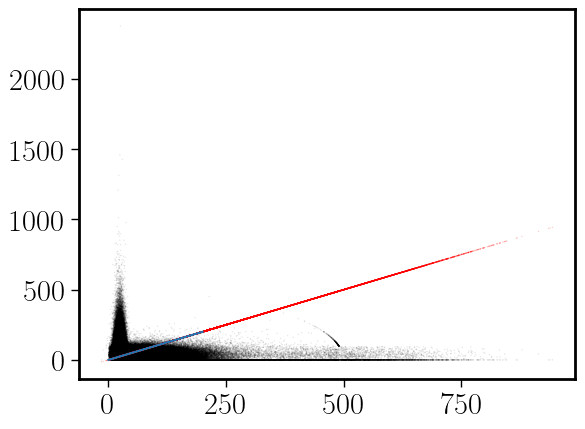

In [276]:
#plt.scatter(REDSHIFT,SDSS_aper_Re, edgecolor='None', color='k', s=1, alpha=0.1)
#plt.scatter(REDSHIFT,disp_Ha_nc, edgecolor='None', color='red', s=2, alpha=0.1)
#plt.scatter(REDSHIFT,disp_Ha_nc-disp_Ha, edgecolor='None', color='k', s=1, alpha=0.1)
plt.scatter(disp_Ha_nc[mask_Ha],V_SDSS_aper[mask_Ha], edgecolor='None', color='k', s=1, alpha=0.1)
plt.scatter(disp_Ha_nc[mask_Ha],disp_Ha[mask_Ha], edgecolor='None', color='r', s=1, alpha=0.2)
plt.plot([0,200],[0,200])

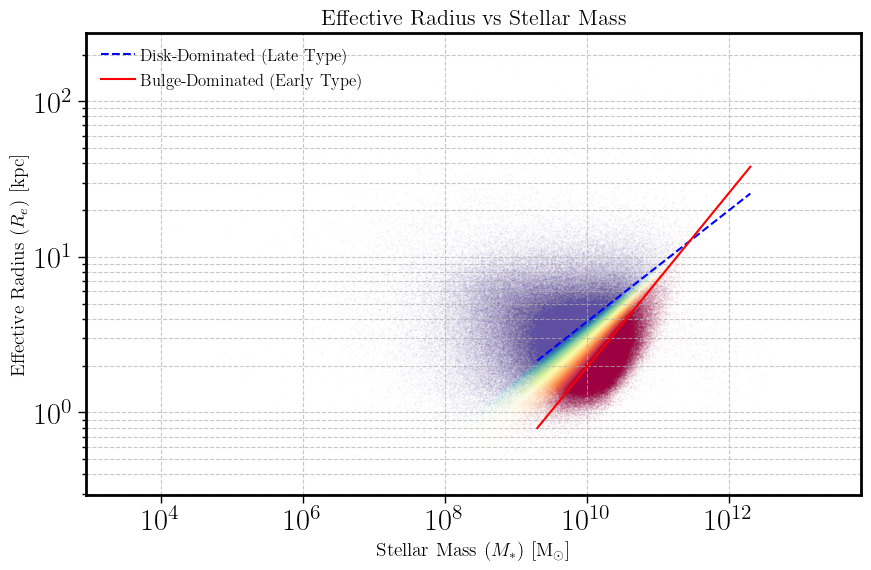

[ 2.15318573  2.20764876  2.26348938  2.32074245  2.37944369  2.43962973
  2.50133812  2.56460737  2.62947697  2.69598739  2.76418013  2.83409775
  2.90578388  2.97928325  3.05464173  3.13190633  3.21112528  3.29234801
  3.37562519  3.46100881  3.54855213  3.63830978  3.73033778  3.82469355
  3.92143597  4.02062541  4.12232377  4.22659449  4.33350266  4.44311499
  4.55549986  4.67072741  4.78886955  4.91        5.03419434  5.16153007
  5.29208665  5.42594555  5.5631903   5.70390654  5.84818209  5.99610695
  6.14777346  6.30327624  6.46271234  6.62618124  6.79378494  6.96562804
  7.14181777  7.32246408  7.50767967  7.69758015  7.89228399  8.09191271
  8.29659086  8.50644618  8.72160962  8.94221543  9.16840128  9.40030832
  9.63808125  9.88186844 10.13182203 10.38809799 10.65085623 10.92026072
 11.19647957 11.47968515 11.77005418 12.06776784 12.37301193 12.6859769
 13.00685807 13.33585565 13.67317496 14.01902647 14.37362601 14.73719484
 15.10995985 15.49215363 15.88401469 16.28578754 16.

In [277]:
stellar_mass = np.logspace(9, 12, 100) # Stellar mass in solar masses



# Empirical relations for Re vs M* (from Shen et al. 2003)
#R_disk = 3.1 * (stellar_mass / 1e10)**0.35  # Effective radius for disk galaxies (in kpc)
#R_bulge = 2.5 * (stellar_mass / 1e10)**0.56  # Effective radius for bulge galaxies (in kpc)
R_disk = 4.91 * (stellar_mass / 1e10 )**0.358  # Effective radius for disk galaxies (kpc)
R_bulge = 2.88 * (stellar_mass / 1e10 )**0.56  # Effective radius for bulge galaxies (kpc)

# Plot the data
plt.figure(figsize=(10, 6))

plt.scatter(tab_nsa_mpa['SERSIC_MASS']*h**2,\
            tab_nsa_mpa['ELPETRO_TH50_R'],edgecolor='None',c=tab_nsa_mpa['F_DISK'],
            vmin=0,vmax=1,cmap='Spectral',s=1,alpha=0.05)#,masterized='True')
plt.loglog(stellar_mass / h**2, R_disk, label='Disk-Dominated (Late Type)', color='blue', linestyle='--')
plt.loglog(stellar_mass / h**2, R_bulge, label='Bulge-Dominated (Early Type)', color='red', linestyle='-')
plt.xlabel('Stellar Mass ($M_*$) [M$_\odot$]', fontsize=14)
plt.ylabel('Effective Radius ($R_e$) [kpc]', fontsize=14)
plt.title('Effective Radius vs Stellar Mass', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, which='both', linestyle='--', alpha=0.7)
plt.show()

print(R_disk)

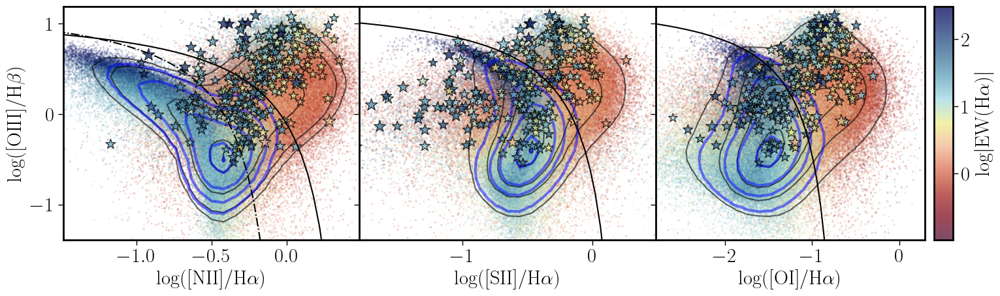

In [320]:
#
#
#
fig, axes = plt.subplots(1,3,figsize=(16,5), sharey=True, squeeze=False)
x_min1=-1.49
x_max1=0.49

x_min_N2 = x_min1
x_max_N2 = x_max1

y_min1=-1.39
y_max1=1.19



x=np.linspace(2*x_min1,2*x_max1,100)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OIII_AGNs=1.14*(x)+0.36;
l_EW_min=-0.99
l_EW_max=2.49
#cm = plt.cm.get_cmap('Spectral')
cm = vel_map().reversed()

s = 5
alpha = 0.2
#c_agn = 'black'
c_early='#ff9700'
c_agn='#000080'
c_late='blue'
#'#7bff7b'

plot_all = 1

if (plot_all==1):

    cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax3=axes[0,2].scatter(O1[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    
    

axes[0,0].plot(x[x<0],cut_y3[x<0],'k-.')
axes[0,0].plot(x,cut_y4,'k-')
axes[0,1].plot(x[x<0.15],cut_y_SII[x<0.15],'k-')
axes[0,2].plot(x[x<-0.6],cut_y_OI[x<-0.6],'k-')


my_contour(axes[0,0],N2[mask_Ha],O3[mask_Ha],x_min1,x_max1,y_min1,y_max1,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

my_contour(axes[0,1],S2[mask_Ha],O3[mask_Ha],x_min1-0.3,x_max1,y_min1,y_max1,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

my_contour(axes[0,2],O1[mask_Ha],O3[mask_Ha],x_min1-1.3,x_max1-0.2,y_min1,y_max1,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)


#plt.rcParams.update({'font.size': 16})
axes[0,0].set_ylabel(r'log([OIII]/H$\beta$)')
axes[0,0].set_xlabel(r'log([NII]/H$\alpha$)')
axes[0,1].set_xlabel(r'log([SII]/H$\alpha$)')
axes[0,2].set_xlabel(r'log([OI]/H$\alpha$)')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min1-0.3,x_max1)
axes[0,2].set_xlim(x_min1-1.3,x_max1-0.2)
axes[0,0].set_ylim(y_min1,y_max1)


N2_min = x_min1-0.3
N2_max = x_max1



#out_dir='figs'
#out_fig=out_dir+'/nsa_mpa_BPT.pdf'
#fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

#0.61/(x-0.47)+1.19

cut_O3_N2_AGNs = 0.61/(N2-0.47)+1.19

cut_O3_N2 = 0.61/(N2-0.05)+1.3
cut_O3_S2 = 0.61/(S2-0.3)+1.3;
cut_O3_OI = 0.73/((O1+0.59))+1.33;#+1.10;
#cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
#1.89*(N2)+0.76;
#cut_y3=0.61/(x-0.05)+1.3


mask_AGNs_N2 = (O3>=cut_O3_N2_AGNs)



mask_MIX_N2 = (O3>=cut_O3_N2) & (O3<=cut_O3_N2_AGNs)
mask_SF_N2 = (O3<cut_O3_N2) & (N2<0) & mask_Ha
mask_SF_N2_EW = mask_SF_N2 & (np.abs(EW_Ha)>6)
mask_AGNs_N2_EW = (~mask_SF_N2) & (np.abs(EW_Ha)>6)
mask_U_EW = (np.abs(EW_Ha)>=3) & (np.abs(EW_Ha)<=6)
mask_SF_S2 = (O3<cut_O3_S2) & mask_Ha
mask_SF_OI = (O3<cut_O3_OI) & (O1<-1) & mask_Ha
mask_RG_EW = (np.abs(EW_Ha)<=3)
mask_SF_EW = (np.abs(EW_Ha)>6)

mask_SF_WHaN = (N2<-0.4) & (np.abs(EW_Ha)>3)
mask_AGNs_WHaN = (N2>-0.4) & (np.abs(EW_Ha)>=3)



mask_SF_BPT = (~mask_AGNs_N2) & mask_SF_S2 & mask_SF_OI
mask_SF_BPT_EW = mask_SF_BPT & mask_SF_EW

mask_AGNs_BPT = (mask_AGNs_N2) & (~mask_SF_S2) & (~mask_SF_OI)
mask_AGNs_BPT_EW = mask_AGNs_BPT & (np.abs(EW_Ha)>=3)



mask_SF = mask_SF_BPT_EW

my_contour(axes[0,0],N2[mask_SF],O3[mask_SF],x_min1,x_max1,y_min1,y_max1,c_color=c_late,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=conts)
my_contour(axes[0,1],S2[mask_SF],O3[mask_SF],x_min1-0.3,x_max1,y_min1,y_max1,c_color=c_late,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=conts)
my_contour(axes[0,2],O1[mask_SF],O3[mask_SF],x_min1-1.3,x_max1+0.2,y_min1,y_max1,c_color=c_late,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=conts)

#
# XMM
#
s_XMM = (np.log10(np.array(tab_nsa_mpa['L_HX']))/40-1)*2000 #*3000
#print(s_XMM[mask_Ha_XMM])
#print(s_XMM[np.isfinite[s_XMM]])


#axes[0,0].scatter(N2[mask_Ha_XMM],O3[mask_Ha_XMM],c=log_EW_Ha[mask_Ha_XMM], marker='*', s=s_XMM[mask_Ha_XMM], alpha=0.5, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

axes[0,0].scatter(N2[mask_Ha_XMM],O3[mask_Ha_XMM],c=log_EW_Ha[mask_Ha_XMM], marker='*',\
                  s=s_XMM[mask_Ha_XMM],\
                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')


axes[0,1].scatter(S2[mask_Ha_XMM],O3[mask_Ha_XMM],c=log_EW_Ha[mask_Ha_XMM], marker='*',\
                  s=s_XMM[mask_Ha_XMM],\
                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')


cax3=axes[0,2].scatter(O1[mask_Ha_XMM],O3[mask_Ha_XMM],c=log_EW_Ha[mask_Ha_XMM], marker='*',\
                  s=s_XMM[mask_Ha_XMM],\
                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

#axes[0,1].scatter(S2[mask_Ha_XMM & mask_SF_S2],O3[mask_Ha_XMM & mask_SF_S2], marker='o',\
#                  s=2*s_XMM[mask_Ha_XMM & mask_SF_S2],\
#                  alpha=0.75, color='None', rasterized=True,edgecolor='red')

#axes[0,2].scatter()

cb=add_colorbar(cax3, aspect=12)
cb.set_label(r'log$\rm |EW(H\alpha)|$')


#print(s_XMM[mask_Ha_XMM])

#axes[0,0].scatter(N2[mask_Ha_XMM],O3[mask_Ha_XMM], color = 'white',\
#                       edgecolor ='k', marker='*', s=s*5, alpha=alpha)

#log_EW_Ha

#axes[0,0].scatter(N2[mask_AGNs_BPT_EW],O3[mask_AGNs_BPT_EW],alpha=0.1)
#axes[0,0].scatter(N2[mask_AGNs_WHaD],O3[mask_AGNs_WHaD],alpha=0.1)

#cax1=axes[0,2].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=-3, vmax=2.5)
#axes[0,2].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,2].plot(x,cut_y4,'b-')
#cb1=add_colorbar(cax1)

#plt.subplots_adjust(wspace=0)
plt.tight_layout(w_pad=-0.3)

out_dir='figs'
out_fig=out_dir+'/nsa_mpa_BPT.png'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")


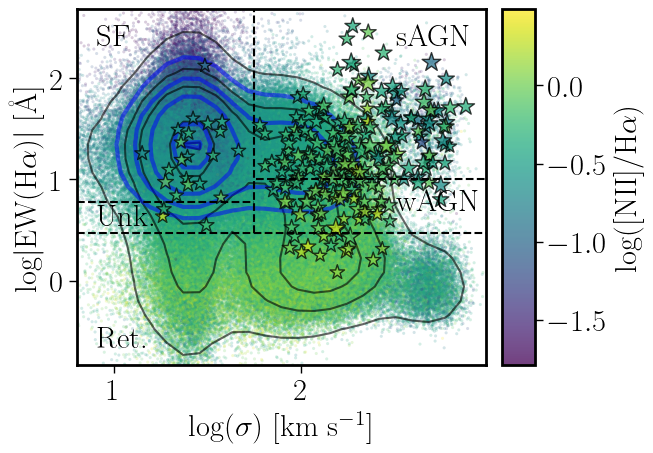

In [307]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'
x_min=0.8
x_max=2.99
y_min=-0.83
y_max=2.68



size=50

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = 'viridis'
#vel_map()


if (plot_all==1):
    cax=ax.scatter(l_disp_Ha[mask_Ha],log_EW_Ha[mask_Ha],c=N2[mask_Ha], marker='o', s=s, alpha=alpha, cmap=cm, vmin=x_min_N2, vmax=x_max_N2,rasterized=True,edgecolor='None')


my_contour(ax,l_disp_Ha[mask_Ha],log_EW_Ha[mask_Ha],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)


my_contour(ax,l_disp_Ha[mask_SF],log_EW_Ha[mask_SF],x_min,x_max,y_min,y_max,c_color=c_late,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=conts)


cax=ax.scatter(l_disp_Ha[mask_Ha_XMM],log_EW_Ha[mask_Ha_XMM],c=N2[mask_Ha_XMM],\
           marker='*', s=s_XMM[mask_Ha_XMM], alpha=0.75,\
           cmap=cm, vmin=N2_min, vmax=N2_max,rasterized=True,edgecolor='k')


mask_SF_WHaD = (l_disp_Ha<1.75) & (log_EW_Ha>0.78) & mask_Ha
mask_AGNs_WHaD = (l_disp_Ha>1.75) & (log_EW_Ha>1) & mask_Ha
mask_RGs_WHaD = (log_EW_Ha<0.47) & mask_Ha


ax.set_xlabel(r'log($\sigma$) [km s$^{-1}$]')
ax.set_ylabel(r'log$|$EW(H$\alpha$)$|$ [${\rm \AA}$]')
x_loc=0.38
y_loc=0.7
handles, labels = ax.get_legend_handles_labels()
#ax.legend(handles, labels,loc=(x_loc,y_loc),frameon=True,\
#          handlelength=1.0,ncol=2,columnspacing=0.05,edgecolor='black')
ax.text(x_min+0.05*np.abs(x_max-x_min),y_min+0.05*np.abs(y_max-y_min),'Ret.')
ax.text(x_min+0.05*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'SF')
ax.text(x_min+0.05*np.abs(x_max-x_min),0.55,'Unk.')
ax.text(x_max-0.22*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'sAGN')
ax.text(x_max-0.22*np.abs(x_max-x_min),0.7,'wAGN')

lEW_cut=np.arange(0.78,1.3,0.5)
lsigma_cut=(lEW_cut+5)/3-0.243
#lsigma_cut=np.arange(1.75,2.3,0.1)
#lEW_cut =-5+3*lsigma_cut
#ax.plot(lsigma_cut,lEW_cut,'--',c='black')
ax.plot([x_min,1.75],[0.78,0.78],'--',c='black')
ax.plot([1.75,1.75],[0.47,y_max],'--',c='black')

#ax.plot([2.1-0.243,2.1-0.243],[lEW_cut[-1],2.2],'--',c='black')
ax.plot([x_min,x_max],[0.47,0.47],'--',c='black')
ax.plot([2-0.243,x_max],[1.0,1.0],'--',c='black')

#ax.set_xlim(1.81,2.75)
#ax.set_xlim(1.5,2.5)
#ax.set_ylim(-0.49,2.1)
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

#ax.scatter(l_disp_Ha[mask_SF_BPT],log_EW_Ha[mask_SF_BPT], color = 'None',\
#                       edgecolor ='k', marker='o', s=s, alpha=alpha*0.1)

cb=add_colorbar(cax)
cb.set_label(r'log([NII]/H$\alpha$)')


plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_WHaD.png'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




In [280]:
search_col(tab_nsa_mpa,'M')

IAUNAME
MAG
CAMCOL
SERSIC_NMGY
SERSIC_NMGY_IVAR
SERSIC_RNMGY
SERSIC_ABSMAG
SERSIC_AMIVAR
SERSIC_MTOL
SERSIC_METS
SERSIC_MASS
PROFMEAN
PROFMEAN_IVAR
ASYMMETRY
CLUMPY
MJD_1
PROGRAMNAME
ELPETRO_NMGY
ELPETRO_NMGY_IVAR
ELPETRO_RNMGY
ELPETRO_ABSMAG
ELPETRO_AMIVAR
ELPETRO_MASS
ELPETRO_MTOL
ELPETRO_METS
MJD_2
LGM_TOT_P2P5
LGM_TOT_P16
LGM_TOT_P50
LGM_TOT_P84
LGM_TOT_P97P5
LGM_FIB_P2P5
LGM_FIB_P16
LGM_FIB_P50
LGM_FIB_P84
LGM_FIB_P97P5
LICK_CN1_MODEL
LICK_CN2_MODEL
LICK_CA4227_MODEL
LICK_G4300_MODEL
LICK_FE4383_MODEL
LICK_CA4455_MODEL
LICK_FE4531_MODEL
LICK_C4668_MODEL
LICK_HB_MODEL
LICK_FE5015_MODEL
LICK_MG1
LICK_MG1_ERR
LICK_MG1_MODEL
LICK_MG1_SUB
LICK_MG1_SUB_ERR
LICK_MG2
LICK_MG2_ERR
LICK_MG2_MODEL
LICK_MG2_SUB
LICK_MG2_SUB_ERR
LICK_MGB
LICK_MGB_ERR
LICK_MGB_MODEL
LICK_MGB_SUB
LICK_MGB_SUB_ERR
LICK_FE5270_MODEL
LICK_FE5335_MODEL
LICK_FE5406_MODEL
LICK_FE5709_MODEL
LICK_FE5782_MODEL
LICK_NAD_MODEL
LICK_TIO1_MODEL
LICK_TIO2_MODEL
LICK_HD_A_MODEL
LICK_HG_A_MODEL
LICK_HD_F_MODEL
LICK_HG_F_MODEL
D

In [281]:
tab_nsa_mpa['CORR_FLUX'] = tab_nsa_mpa['ELPETRO_FLUX'] - tab_nsa_mpa['FIBER_FLUX']
mask_z = (tab_nsa_mpa['Z_2']>=0.005) & (tab_nsa_mpa['Z_2']<0.1)
tab_nsa_mpa['CORR_MAG'] = 22.5 - 2.5*np.log10(tab_nsa_mpa['CORR_FLUX'])

In [282]:
mask_SF_WHaD = (l_disp_Ha<1.75) & (log_EW_Ha>0.78) & mask_oHa
mask_U_WHaD = (l_disp_Ha<1.75) & (log_EW_Ha>0.47)  & (log_EW_Ha<=0.78) & mask_oHa
mask_AGNs_WHaD = (l_disp_Ha>=1.75) & (log_EW_Ha>=0.47) & mask_oHa
mask_RGs_WHaD = (log_EW_Ha<=0.47) & mask_oHa


n_nsa_mpa = len(tab_nsa_mpa)
print(f'# {z_min} < redshift < {z_max}')
print(f'# gal NSA_MPA: {n_nsa_mpa}')
n_nsa_mpa_oHa = len(tab_nsa_mpa[mask_oHa])
print(f'# gal NSA_MPA (Ha S/N cut): {n_nsa_mpa_oHa}')
n_nsa_mpa_Ha = len(tab_nsa_mpa[mask_Ha])
print(f'# gal NSA_MPA (Ha,N2,Hb S/N cut): {n_nsa_mpa_Ha}')
print(f'# log(L_X) > {LX_lim} HR>{HR_lim}')

n_X_oAGNs = len(tab_nsa_mpa[mask_oHa_XMM & mask_oHa])
print(f'# X-Ray XMM/NSA +SN Ha: {n_X_oAGNs}')
n_X_AGNs = len(tab_nsa_mpa[mask_Ha_XMM])
print(f'# X-Ray XMM/NSA + SN Ha,N2,Hb: {n_X_AGNs}')

n_X_AGNs_SF = len(tab_nsa_mpa[mask_Ha_XMM])
print(f'# X-Ray XMM/NSA: {n_X_AGNs}')
print('---------- BPT N2 K03 + K01 ------------------')
n_X_AGNs_SF_N2 = len(tab_nsa_mpa[mask_Ha_XMM & mask_SF_N2])
print(f'# X-Ray XMM/NSA | SF BPT(N2): {n_X_AGNs_SF_N2} , {n_X_AGNs_SF_N2/n_X_AGNs}')
n_X_AGNs_MIX_N2 = len(tab_nsa_mpa[mask_Ha_XMM & mask_MIX_N2])
print(f'# X-Ray XMM/NSA | MIX BPT(N2): {n_X_AGNs_MIX_N2} , {n_X_AGNs_MIX_N2/n_X_AGNs}')
n_X_AGNs_AGNs_N2 = len(tab_nsa_mpa[mask_Ha_XMM & mask_AGNs_N2])
print(f'# X-Ray XMM/NSA | AGNs BPT(N2): {n_X_AGNs_AGNs_N2} , {n_X_AGNs_AGNs_N2/n_X_AGNs}')

print('---------- BPT ALL K01 ------------------')
n_X_AGNs_SF_BPT = len(tab_nsa_mpa[mask_Ha_XMM & mask_SF_BPT])
print(f'# X-Ray XMM/NSA | SF BPT(ALL): {n_X_AGNs_SF_BPT} , {n_X_AGNs_SF_BPT/n_X_AGNs}')
n_X_AGNs_AGNs_BPT = len(tab_nsa_mpa[mask_Ha_XMM & mask_AGNs_BPT])
print(f'# X-Ray XMM/NSA | AGNs BPT(ALL): {n_X_AGNs_AGNs_BPT} , {n_X_AGNs_AGNs_BPT/n_X_AGNs}')
n_X_AGNs_U_BPT = n_X_AGNs - n_X_AGNs_SF_BPT - n_X_AGNs_AGNs_BPT
print(f'# X-Ray XMM/NSA | Unk. BPT(ALL): {n_X_AGNs_U_BPT} , {n_X_AGNs_U_BPT/n_X_AGNs}')

print('---------- BPT N2 K01 + EW------------------')
n_X_AGNs_SF_N2_EW = len(tab_nsa_mpa[mask_Ha_XMM & (mask_SF_N2_EW)])
print(f'# X-Ray XMM/NSA | SF BPT(N2) +EW: {n_X_AGNs_SF_N2_EW} , {n_X_AGNs_SF_N2_EW/n_X_AGNs}')
n_X_AGNs_AGNs_N2_EW = len(tab_nsa_mpa[mask_Ha_XMM & mask_AGNs_N2_EW])
print(f'# X-Ray XMM/NSA | AGNs BPT(N2)+EW: {n_X_AGNs_AGNs_N2_EW} , {n_X_AGNs_AGNs_N2_EW/n_X_AGNs}')
n_X_AGNs_U_N2_EW = len(tab_nsa_mpa[mask_Ha_XMM & mask_U_EW])
print(f'# X-Ray XMM/NSA | Unk. BPT(N2)+EW: {n_X_AGNs_U_N2_EW} , {n_X_AGNs_U_N2_EW/n_X_AGNs}')

print('---------- BPT ALL + EW K01 + CF10 ------------------')
n_X_AGNs_SF_BPT_EW = len(tab_nsa_mpa[mask_Ha_XMM & mask_SF_BPT_EW])
print(f'# X-Ray XMM/NSA | SF BPT(ALL + EW): {n_X_AGNs_SF_BPT_EW} , {n_X_AGNs_SF_BPT_EW/n_X_AGNs}')
n_X_AGNs_AGNs_BPT_EW = len(tab_nsa_mpa[mask_Ha_XMM & mask_AGNs_BPT_EW])
print(f'# X-Ray XMM/NSA | AGNs BPT(ALL + EW): {n_X_AGNs_AGNs_BPT_EW} , {n_X_AGNs_AGNs_BPT_EW/n_X_AGNs}')

print('---------- WHAN CF10 ------------------')
n_X_AGNs_SF_WHaN = len(tab_nsa_mpa[mask_Ha_XMM & mask_SF_WHaN])
print(f'# X-Ray XMM/NSA | SF WHaN: {n_X_AGNs_SF_WHaN} , {n_X_AGNs_SF_WHaN/n_X_AGNs}')
n_X_AGNs_AGNs_WHaN = len(tab_nsa_mpa[mask_Ha_XMM & mask_AGNs_WHaN])
print(f'# X-Ray XMM/NSA | AGNs WHaN: {n_X_AGNs_AGNs_WHaN} , {n_X_AGNs_AGNs_WHaN/n_X_AGNs}')

print('---------- RGs EW ------------------')
n_X_AGNs_RGs_EW = len(tab_nsa_mpa[mask_Ha_XMM & mask_RG_EW])
print(f'# X-Ray XMM/NSA | RGs (EW): {n_X_AGNs_RGs_EW} , {n_X_AGNs_RGs_EW/n_X_AGNs}')


print('---------- WHAD SF24 ------------------')
n_X_AGNs_SF_WHaD = len(tab_nsa_mpa[mask_oHa_XMM & mask_SF_WHaD])
print(f'# X-Ray XMM/NSA | SF WHaD: {n_X_AGNs_SF_WHaD} , {n_X_AGNs_SF_WHaD/n_X_oAGNs}')
n_X_AGNs_AGNs_WHaD = len(tab_nsa_mpa[mask_oHa_XMM & mask_AGNs_WHaD])
print(f'# X-Ray XMM/NSA | AGNs WHaD: {n_X_AGNs_AGNs_WHaD} , {n_X_AGNs_AGNs_WHaD/n_X_oAGNs}')
n_X_AGNs_U_WHaD = len(tab_nsa_mpa[mask_oHa_XMM & mask_U_WHaD])
print(f'# X-Ray XMM/NSA | Unk. WHaD: {n_X_AGNs_U_WHaD} , {n_X_AGNs_U_WHaD/n_X_oAGNs}')
n_X_AGNs_oRGs_EW = len(tab_nsa_mpa[mask_oHa_XMM & mask_RG_EW])
print(f'# X-Ray XMM/NSA | RGs WHaD: {n_X_AGNs_oRGs_EW} , {n_X_AGNs_oRGs_EW/n_X_oAGNs}')




#D,P = ks_2d_2s(data1, data2):







#mask_SF_N2 = (O3<cut_O3_N2) & (N2<0) & mask_Ha
#mask_SF_S2 = (O3<cut_O3_S2) & mask_Ha
#mask_SF_OI = (O3<cut_O3_OI) & mask_Ha
#mask_RG_EW = (np.abs(EW_Ha)<3)
#mask_SF_EW = (np.abs(EW_Ha)>6)
#mask_SF_BPT = mask_SF_N2 & mask_SF_S2 & mask_SF_OI
#
#mask_SF_BPT_EW = mask_SF_N2 & mask_SF_EW
#
#mask_SF = mask_SF_BPT_EW



# 0.005 < redshift < 0.3
# gal NSA_MPA: 547935
# gal NSA_MPA (Ha S/N cut): 467329
# gal NSA_MPA (Ha,N2,Hb S/N cut): 431085
# log(L_X) > 42 HR>0.0
# X-Ray XMM/NSA +SN Ha: 252
# X-Ray XMM/NSA + SN Ha,N2,Hb: 248
# X-Ray XMM/NSA: 248
---------- BPT N2 K03 + K01 ------------------
# X-Ray XMM/NSA | SF BPT(N2): 31 , 0.125
# X-Ray XMM/NSA | MIX BPT(N2): 83 , 0.3346774193548387
# X-Ray XMM/NSA | AGNs BPT(N2): 133 , 0.5362903225806451
---------- BPT ALL K01 ------------------
# X-Ray XMM/NSA | SF BPT(ALL): 88 , 0.3548387096774194
# X-Ray XMM/NSA | AGNs BPT(ALL): 103 , 0.4153225806451613
# X-Ray XMM/NSA | Unk. BPT(ALL): 57 , 0.22983870967741934
---------- BPT N2 K01 + EW------------------
# X-Ray XMM/NSA | SF BPT(N2) +EW: 31 , 0.125
# X-Ray XMM/NSA | AGNs BPT(N2)+EW: 178 , 0.717741935483871
# X-Ray XMM/NSA | Unk. BPT(N2)+EW: 25 , 0.10080645161290322
---------- BPT ALL + EW K01 + CF10 ------------------
# X-Ray XMM/NSA | SF BPT(ALL + EW): 85 , 0.34274193548387094
# X-Ray XMM/NSA | AGNs BPT(ALL + 

In [283]:
n_nsa_mpa = len(tab_nsa_mpa)
print(f'# {z_min} < redshift < {z_max}')
print(f'# gal NSA_MPA: {n_nsa_mpa}')
n_nsa_mpa_oHa = len(tab_nsa_mpa[mask_oHa])
print(f'# gal NSA_MPA (Ha S/N cut): {n_nsa_mpa_oHa}')
n_nsa_mpa_Ha = len(tab_nsa_mpa[mask_Ha])
print(f'# gal NSA_MPA (Ha,N2,Hb S/N cut): {n_nsa_mpa_Ha}')
print(f'# log(L_X) > {LX_lim} HR>{HR_lim}')
print(f'############## 2D KS-tests #######################')
data1 = np.array((O3[mask_Ha_XMM & mask_z],N2[mask_Ha_XMM & mask_z])).T
data2 = np.array((O3[mask_Ha_XMM & mask_z],N2[mask_Ha_XMM & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. itself D: {D}, P: {P}')

# 0.005 < redshift < 0.3
# gal NSA_MPA: 547935
# gal NSA_MPA (Ha S/N cut): 467329
# gal NSA_MPA (Ha,N2,Hb S/N cut): 431085
# log(L_X) > 42 HR>0.0
############## 2D KS-tests #######################
# X-Ray XMM/NSA vs. itself D: 0.0, P: 1.0


In [284]:
#
# KS-tests
#

print(f'############## 2D KS-tests #######################')
data1 = np.array((O3[mask_Ha_XMM & mask_z],N2[mask_Ha_XMM & mask_z])).T
data2 = np.array((O3[mask_AGNs_N2 & mask_z],N2[mask_AGNs_N2 & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(N2 K01+K03) D: {D}, P: {P}')

data1 = np.array((O3[mask_Ha_XMM & mask_z],N2[mask_Ha_XMM & mask_z])).T
data2 = np.array((O3[mask_AGNs_BPT & mask_z],N2[mask_AGNs_BPT & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(ALL) D: {D}, P: {P}')


data1 = np.array((O3[mask_Ha_XMM & mask_z],N2[mask_Ha_XMM & mask_z])).T
data2 = np.array((O3[mask_AGNs_N2_EW & mask_z],N2[mask_AGNs_N2_EW & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(K01+EW) D: {D}, P: {P}')

data1 = np.array((O3[mask_Ha_XMM & mask_z],N2[mask_Ha_XMM & mask_z])).T
data2 = np.array((O3[mask_AGNs_BPT_EW & mask_z],N2[mask_AGNs_BPT_EW & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(K01,K03+EW) D: {D}, P: {P}')

data1 = np.array((O3[mask_Ha_XMM & mask_z],N2[mask_Ha_XMM & mask_z])).T
data2 = np.array((O3[mask_AGNs_WHaN & mask_z],N2[mask_AGNs_WHaN & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. WHaN(CF10) D: {D}, P: {P}')

data1 = np.array((O3[mask_Ha_XMM & mask_z],N2[mask_Ha_XMM & mask_z])).T
data2 = np.array((O3[mask_AGNs_WHaD & mask_z],N2[mask_AGNs_WHaD & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. WHaD(S24) D: {D}, P: {P}')


############## 2D KS-tests #######################
# X-Ray XMM/NSA vs. BPT(N2 K01+K03) D: 6.182, P: <0.001
# X-Ray XMM/NSA vs. BPT(ALL) D: 5.581, P: <0.001
# X-Ray XMM/NSA vs. BPT(K01+EW) D: 5.815, P: <0.001
# X-Ray XMM/NSA vs. BPT(K01,K03+EW) D: 4.634, P: <0.001
# X-Ray XMM/NSA vs. WHaN(CF10) D: 7.44, P: <0.001
# X-Ray XMM/NSA vs. WHaD(S24) D: 6.674, P: <0.001


In [285]:
#
# KS-tests
#

X1 = np.log10(tab_nsa_mpa['ELPETRO_MASS']/(0.71**2))
X2 = tab_nsa_mpa['CORR_MAG'][:,1]-tab_nsa_mpa['CORR_MAG'][:,2]
Y = tab_nsa_mpa['CORR_MAG'][:,2]-tab_nsa_mpa['CORR_MAG'][:,4]


print(f'############## u-r vs Log(M*) #######################')

print(f'############## 2D KS-tests #######################')
data1 = np.array((X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X1[mask_AGNs_N2 & mask_z],Y[mask_AGNs_N2 & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(Y K01+K03) D: {D}, P: {P}')

data1 = np.array((X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X1[mask_AGNs_BPT & mask_z],Y[mask_AGNs_BPT & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(ALL) D: {D}, P: {P}')


data1 = np.array((X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X1[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(K01+EW) D: {D}, P: {P}')

data1 = np.array((X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X1[mask_AGNs_BPT_EW & mask_z],Y[mask_AGNs_BPT_EW & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(K01,K03+EW) D: {D}, P: {P}')

data1 = np.array((X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X1[mask_AGNs_WHaN & mask_z],Y[mask_AGNs_WHaN & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. WHaN(CF10) D: {D}, P: {P}')

data1 = np.array((X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. WHaD(S24) D: {D}, P: {P}')


print(f'############## u-r vs NUV-u #######################')

print(f'############## 2D KS-tests #######################')
data1 = np.array((X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X2[mask_AGNs_N2 & mask_z],Y[mask_AGNs_N2 & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(Y K01+K03) D: {D}, P: {P}')

data1 = np.array((X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X2[mask_AGNs_BPT & mask_z],Y[mask_AGNs_BPT & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(ALL) D: {D}, P: {P}')


data1 = np.array((X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X2[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(K01+EW) D: {D}, P: {P}')

data1 = np.array((X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X2[mask_AGNs_BPT_EW & mask_z],Y[mask_AGNs_BPT_EW & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. BPT(K01,K03+EW) D: {D}, P: {P}')

data1 = np.array((X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X2[mask_AGNs_WHaN & mask_z],Y[mask_AGNs_WHaN & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. WHaN(CF10) D: {D}, P: {P}')

data1 = np.array((X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z])).T
data2 = np.array((X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z])).T
#D,P = ks_2d_2s(data1, data2)
np.random.seed(0)
D,P = KS2DF(data1, data2)
D = np.round(D,3)
P = np.round(P,3)
if (P<0.001):
    P='<0.001'
print(f'# X-Ray XMM/NSA vs. WHaD(S24) D: {D}, P: {P}')


############## u-r vs Log(M*) #######################
############## 2D KS-tests #######################
# X-Ray XMM/NSA vs. BPT(Y K01+K03) D: 4.829, P: <0.001
# X-Ray XMM/NSA vs. BPT(ALL) D: 4.894, P: <0.001
# X-Ray XMM/NSA vs. BPT(K01+EW) D: 3.36, P: <0.001
# X-Ray XMM/NSA vs. BPT(K01,K03+EW) D: 2.322, P: <0.001
# X-Ray XMM/NSA vs. WHaN(CF10) D: 3.525, P: <0.001
# X-Ray XMM/NSA vs. WHaD(S24) D: 2.719, P: <0.001
############## u-r vs NUV-u #######################
############## 2D KS-tests #######################
# X-Ray XMM/NSA vs. BPT(Y K01+K03) D: 5.229, P: <0.001
# X-Ray XMM/NSA vs. BPT(ALL) D: 5.315, P: <0.001
# X-Ray XMM/NSA vs. BPT(K01+EW) D: 1.786, P: 0.002
# X-Ray XMM/NSA vs. BPT(K01,K03+EW) D: 2.274, P: <0.001
# X-Ray XMM/NSA vs. WHaN(CF10) D: 2.022, P: <0.001
# X-Ray XMM/NSA vs. WHaD(S24) D: 1.73, P: 0.003


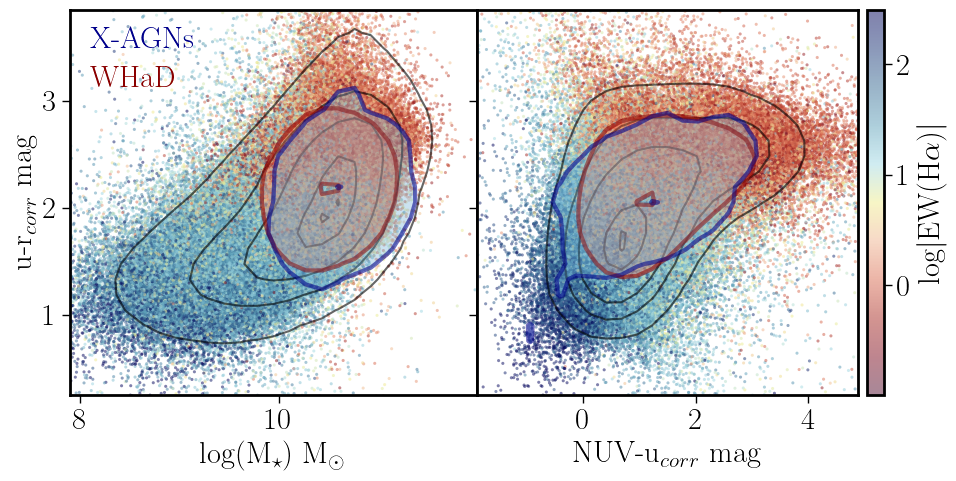

In [305]:
#
#
#
fig, axes = plt.subplots(1,2,figsize=(10.5,5), sharey=True, squeeze=False)

x_min1 = 7.9
x_max1 = 11.99
x_min2 = -1.9
x_max2 = 4.9
y_min = 0.25
y_max = 3.85

cm = vel_map().reversed()
x=np.linspace(2*x_min1,2*x_max1,100)

s = 5
alpha = 0.5
#c_agn = 'black'
c_early='#ff9700'
c_agn='#000080'
c_late='blue'
#'#7bff7b'

plot_all = 1

X1 = np.log10(tab_nsa_mpa['ELPETRO_MASS']/(0.71**2))
X2 = tab_nsa_mpa['CORR_MAG'][:,1]-tab_nsa_mpa['CORR_MAG'][:,2]
Y = tab_nsa_mpa['CORR_MAG'][:,2]-tab_nsa_mpa['CORR_MAG'][:,4]
C = log_EW_Ha

if (plot_all==1):
    cax=axes[0,0].scatter(X1[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax=axes[0,1].scatter(X2[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')

my_contour(axes[0,0],X1[mask_Ha],Y[mask_Ha],x_min1,x_max1,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
#           conts=[0.95,0.5,0.2,0.01])
                   conts=conts)

my_contour(axes[0,1],X2[mask_Ha],Y[mask_Ha],x_min2,x_max2,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

axes[0,0].set_ylabel(r'u-r$_{corr}$ mag')
axes[0,0].set_xlabel(r'log(M$_\star$) M$_\odot$')
axes[0,1].set_xlabel(r'NUV-u$_{corr}$ mag')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min2,x_max2)
axes[0,0].set_ylim(y_min,y_max)
axes[0,1].set_ylim(y_min,y_max)




plt.subplots_adjust(wspace=0)



axes[0,0].text(x_min1+0.05*np.abs(x_max1-x_min1),y_max-0.1*np.abs(y_max-y_min),'X-AGNs',color='darkblue')
axes[0,0].text(x_min1+0.05*np.abs(x_max1-x_min1),y_max-0.2*np.abs(y_max-y_min),'WHaD',color='darkred')

my_contourf(axes[0,0],X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contourf(axes[0,1],X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contour(axes[0,0],X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


my_contour(axes[0,1],X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


#my_contour(axes[0,0],X1[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min1,x_max1,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])
#my_contour(axes[0,1],X2[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min2,x_max2,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

s_XMM = (np.log10(np.array(tab_nsa_mpa['L_HX']))/40-1)*2000 #*3000

#cax = axes[0,0].scatter(X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

#cax = axes[0,1].scatter(X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')





cb=add_colorbar(cax, aspect=12)
cb.set_label(r'log$\rm |EW(H\alpha)|$')


out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XAGNs_WHaD.png'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")


#X1

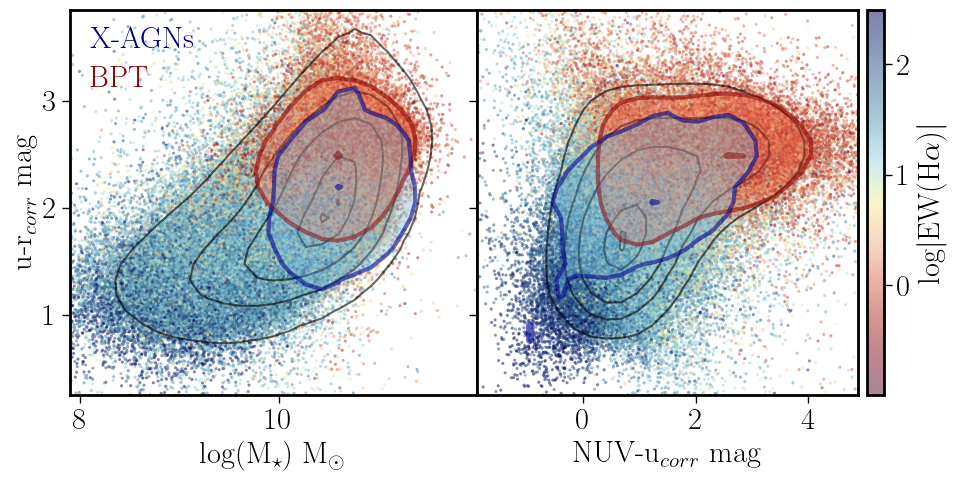

In [304]:
#
#
#
fig, axes = plt.subplots(1,2,figsize=(10.5,5), sharey=True, squeeze=False)

x_min1 = 7.9
x_max1 = 11.99
x_min2 = -1.9
x_max2 = 4.9
y_min = 0.25
y_max = 3.85

cm = vel_map().reversed()
x=np.linspace(2*x_min1,2*x_max1,100)

s = 5
alpha = 0.5
#c_agn = 'black'
c_early='#ff9700'
c_agn='#000080'
c_late='blue'
#'#7bff7b'

plot_all = 1

X1 = np.log10(tab_nsa_mpa['ELPETRO_MASS']/(0.71**2))
X2 = tab_nsa_mpa['CORR_MAG'][:,1]-tab_nsa_mpa['CORR_MAG'][:,2]
Y = tab_nsa_mpa['CORR_MAG'][:,2]-tab_nsa_mpa['CORR_MAG'][:,4]
C = log_EW_Ha

if (plot_all==1):
    cax=axes[0,0].scatter(X1[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax=axes[0,1].scatter(X2[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')

my_contour(axes[0,0],X1[mask_Ha],Y[mask_Ha],x_min1,x_max1,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
#           conts=[0.95,0.5,0.2,0.01])
                   conts=conts)

my_contour(axes[0,1],X2[mask_Ha],Y[mask_Ha],x_min2,x_max2,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

axes[0,0].set_ylabel(r'u-r$_{corr}$ mag')
axes[0,0].set_xlabel(r'log(M$_\star$) M$_\odot$')
axes[0,1].set_xlabel(r'NUV-u$_{corr}$ mag')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min2,x_max2)
axes[0,0].set_ylim(y_min,y_max)
axes[0,1].set_ylim(y_min,y_max)




plt.subplots_adjust(wspace=0)



axes[0,0].text(x_min1+0.05*np.abs(x_max1-x_min1),y_max-0.1*np.abs(y_max-y_min),'X-AGNs',color='darkblue')
axes[0,0].text(x_min1+0.05*np.abs(x_max1-x_min1),y_max-0.2*np.abs(y_max-y_min),'BPT',color='darkred')

my_contourf(axes[0,0],X1[mask_AGNs_BPT & mask_z],Y[mask_AGNs_BPT & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contourf(axes[0,1],X2[mask_AGNs_BPT & mask_z],Y[mask_AGNs_BPT & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contour(axes[0,0],X1[mask_AGNs_BPT & mask_z],Y[mask_AGNs_BPT & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


my_contour(axes[0,1],X2[mask_AGNs_BPT & mask_z],Y[mask_AGNs_BPT & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


#my_contour(axes[0,0],X1[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min1,x_max1,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])
#my_contour(axes[0,1],X2[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min2,x_max2,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

s_XMM = (np.log10(np.array(tab_nsa_mpa['L_HX']))/40-1)*2000 #*3000

#cax = axes[0,0].scatter(X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

#cax = axes[0,1].scatter(X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')





cb=add_colorbar(cax, aspect=12)
cb.set_label(r'log$\rm |EW(H\alpha)|$')


out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XAGNs_BPT.png'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")


#X1

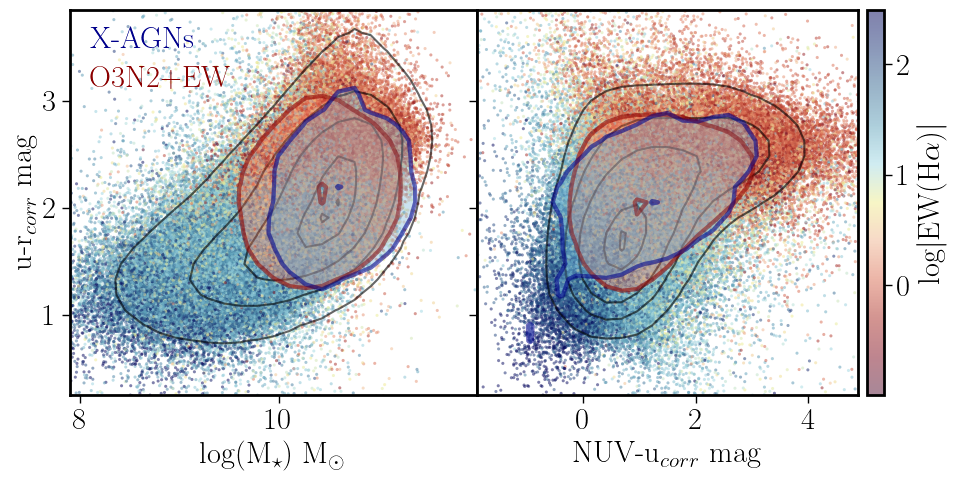

In [303]:
#
#
#
fig, axes = plt.subplots(1,2,figsize=(10.5,5), sharey=True, squeeze=False)

x_min1 = 7.9
x_max1 = 11.99
x_min2 = -1.9
x_max2 = 4.9
y_min = 0.25
y_max = 3.85

cm = vel_map().reversed()
x=np.linspace(2*x_min1,2*x_max1,100)

s = 5
alpha = 0.5
#c_agn = 'black'
c_early='#ff9700'
c_agn='#000080'
c_late='blue'
#'#7bff7b'

plot_all = 1

X1 = np.log10(tab_nsa_mpa['ELPETRO_MASS']/(0.71**2))
X2 = tab_nsa_mpa['CORR_MAG'][:,1]-tab_nsa_mpa['CORR_MAG'][:,2]
Y = tab_nsa_mpa['CORR_MAG'][:,2]-tab_nsa_mpa['CORR_MAG'][:,4]
C = log_EW_Ha

if (plot_all==1):
    cax=axes[0,0].scatter(X1[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax=axes[0,1].scatter(X2[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')

my_contour(axes[0,0],X1[mask_Ha],Y[mask_Ha],x_min1,x_max1,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
#           conts=[0.95,0.5,0.2,0.01])
                   conts=conts)

my_contour(axes[0,1],X2[mask_Ha],Y[mask_Ha],x_min2,x_max2,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

axes[0,0].set_ylabel(r'u-r$_{corr}$ mag')
axes[0,0].set_xlabel(r'log(M$_\star$) M$_\odot$')
axes[0,1].set_xlabel(r'NUV-u$_{corr}$ mag')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min2,x_max2)
axes[0,0].set_ylim(y_min,y_max)
axes[0,1].set_ylim(y_min,y_max)




plt.subplots_adjust(wspace=0)



axes[0,0].text(x_min1+0.05*np.abs(x_max1-x_min1),y_max-0.1*np.abs(y_max-y_min),'X-AGNs',color='darkblue')
axes[0,0].text(x_min1+0.05*np.abs(x_max1-x_min1),y_max-0.2*np.abs(y_max-y_min),'O3N2+EW',color='darkred')

my_contourf(axes[0,0],X1[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contourf(axes[0,1],X2[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contour(axes[0,0],X1[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


my_contour(axes[0,1],X2[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


#my_contour(axes[0,0],X1[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min1,x_max1,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])
#my_contour(axes[0,1],X2[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min2,x_max2,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

s_XMM = (np.log10(np.array(tab_nsa_mpa['L_HX']))/40-1)*2000 #*3000

#cax = axes[0,0].scatter(X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

#cax = axes[0,1].scatter(X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')





cb=add_colorbar(cax, aspect=12)
cb.set_label(r'log$\rm |EW(H\alpha)|$')


out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XAGNs_O3N2_EW.png'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")


#X1

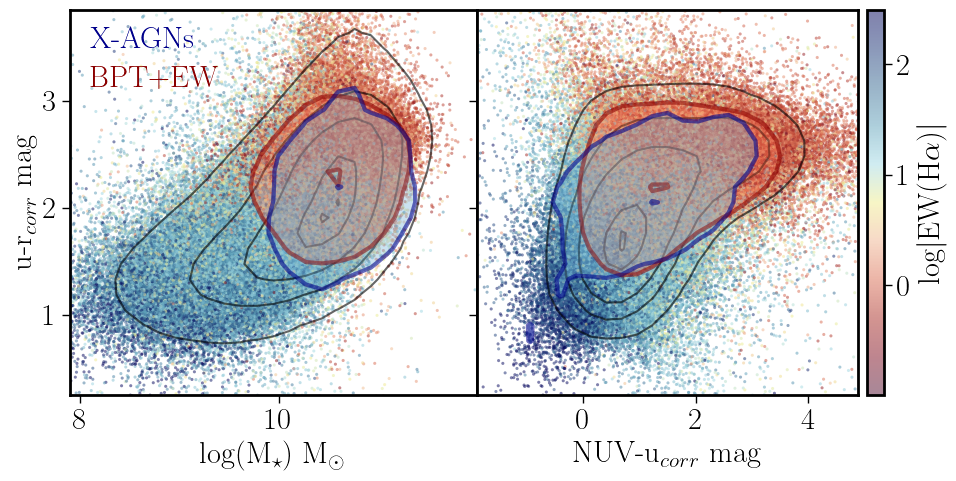

In [174]:
#
#
#
fig, axes = plt.subplots(1,2,figsize=(10.5,5), sharey=True, squeeze=False)

x_min1 = 7.9
x_max1 = 11.99
x_min2 = -1.9
x_max2 = 4.9
y_min = 0.25
y_max = 3.85

cm = vel_map().reversed()
x=np.linspace(2*x_min1,2*x_max1,100)

s = 5
alpha = 0.5
#c_agn = 'black'
c_early='#ff9700'
c_agn='#000080'
c_late='blue'
#'#7bff7b'

plot_all = 1

X1 = np.log10(tab_nsa_mpa['ELPETRO_MASS']/(0.71**2))
X2 = tab_nsa_mpa['CORR_MAG'][:,1]-tab_nsa_mpa['CORR_MAG'][:,2]
Y = tab_nsa_mpa['CORR_MAG'][:,2]-tab_nsa_mpa['CORR_MAG'][:,4]
C = log_EW_Ha

if (plot_all==1):
    cax=axes[0,0].scatter(X1[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax=axes[0,1].scatter(X2[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')

my_contour(axes[0,0],X1[mask_Ha],Y[mask_Ha],x_min1,x_max1,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
#           conts=[0.95,0.5,0.2,0.01])
                   conts=conts)

my_contour(axes[0,1],X2[mask_Ha],Y[mask_Ha],x_min2,x_max2,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

axes[0,0].set_ylabel(r'u-r$_{corr}$ mag')
axes[0,0].set_xlabel(r'log(M$_\star$) M$_\odot$')
axes[0,1].set_xlabel(r'NUV-u$_{corr}$ mag')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min2,x_max2)
axes[0,0].set_ylim(y_min,y_max)
axes[0,1].set_ylim(y_min,y_max)




plt.subplots_adjust(wspace=0)



axes[0,0].text(x_min1+0.05*np.abs(x_max1-x_min1),y_max-0.1*np.abs(y_max-y_min),'X-AGNs',color='darkblue')
axes[0,0].text(x_min1+0.05*np.abs(x_max1-x_min1),y_max-0.2*np.abs(y_max-y_min),'BPT+EW',color='darkred')

my_contourf(axes[0,0],X1[mask_AGNs_BPT_EW & mask_z],Y[mask_AGNs_BPT_EW & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contourf(axes[0,1],X2[mask_AGNs_BPT_EW & mask_z],Y[mask_AGNs_BPT_EW & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contour(axes[0,0],X1[mask_AGNs_BPT_EW & mask_z],Y[mask_AGNs_BPT_EW & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


my_contour(axes[0,1],X2[mask_AGNs_BPT_EW & mask_z],Y[mask_AGNs_BPT_EW & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


#my_contour(axes[0,0],X1[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min1,x_max1,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])
#my_contour(axes[0,1],X2[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min2,x_max2,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

s_XMM = (np.log10(np.array(tab_nsa_mpa['L_HX']))/40-1)*2000 #*3000

#cax = axes[0,0].scatter(X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

#cax = axes[0,1].scatter(X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')





cb=add_colorbar(cax, aspect=12)
cb.set_label(r'log$\rm |EW(H\alpha)|$')


out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XAGNs_BPT_EW.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")


#X1

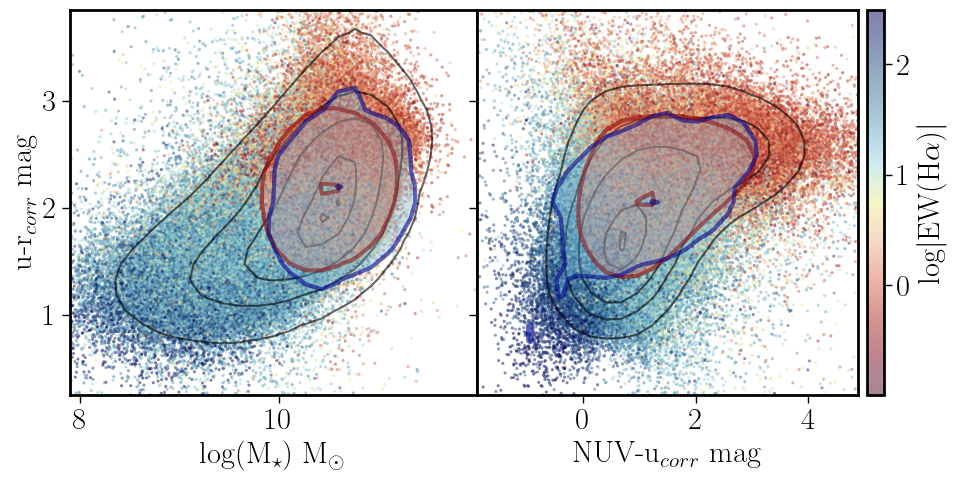

In [161]:
#
#
#
fig, axes = plt.subplots(1,2,figsize=(10.5,5), sharey=True, squeeze=False)

x_min1 = 7.9
x_max1 = 11.99
x_min2 = -1.9
x_max2 = 4.9
y_min = 0.25
y_max = 3.85

cm = vel_map().reversed()
x=np.linspace(2*x_min1,2*x_max1,100)

s = 5
alpha = 0.5
#c_agn = 'black'
c_early='#ff9700'
c_agn='#000080'
c_late='blue'
#'#7bff7b'

plot_all = 1

X1 = np.log10(tab_nsa_mpa['ELPETRO_MASS']/(0.71**2))
X2 = tab_nsa_mpa['CORR_MAG'][:,1]-tab_nsa_mpa['CORR_MAG'][:,2]
Y = tab_nsa_mpa['CORR_MAG'][:,2]-tab_nsa_mpa['CORR_MAG'][:,4]
C = log_EW_Ha

if (plot_all==1):
    cax=axes[0,0].scatter(X1[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax=axes[0,1].scatter(X2[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')

my_contour(axes[0,0],X1[mask_Ha],Y[mask_Ha],x_min1,x_max1,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
#           conts=[0.95,0.5,0.2,0.01])
                   conts=conts)

my_contour(axes[0,1],X2[mask_Ha],Y[mask_Ha],x_min2,x_max2,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

axes[0,0].set_ylabel(r'u-r$_{corr}$ mag')
axes[0,0].set_xlabel(r'log(M$_\star$) M$_\odot$')
axes[0,1].set_xlabel(r'NUV-u$_{corr}$ mag')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min2,x_max2)
axes[0,0].set_ylim(y_min,y_max)
axes[0,1].set_ylim(y_min,y_max)




plt.subplots_adjust(wspace=0)



my_contourf(axes[0,0],X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contourf(axes[0,1],X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Reds')

my_contourf(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Blues')


my_contour(axes[0,0],X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,0],X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


my_contour(axes[0,1],X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkred',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,1],X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='darkblue',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


#my_contour(axes[0,0],X1[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min1,x_max1,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])
#my_contour(axes[0,1],X2[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],x_min2,x_max2,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

s_XMM = (np.log10(np.array(tab_nsa_mpa['L_HX']))/40-1)*2000 #*3000

#cax = axes[0,0].scatter(X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

#cax = axes[0,1].scatter(X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')



cb=add_colorbar(cax, aspect=12)
cb.set_label(r'log$\rm |EW(H\alpha)|$')


out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XAGNs_WHaD.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")


#X1

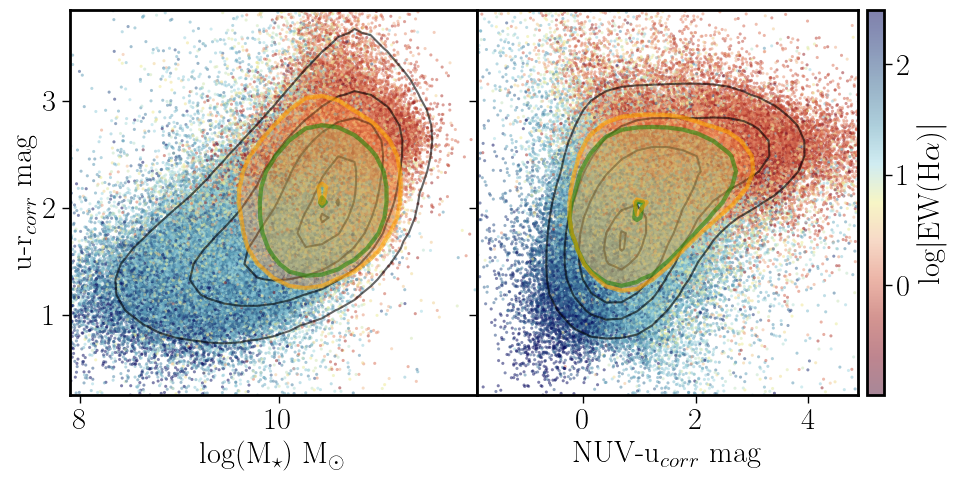

In [151]:
#
#
#
fig, axes = plt.subplots(1,2,figsize=(10.5,5), sharey=True, squeeze=False)

x_min1 = 7.9
x_max1 = 11.99
x_min2 = -1.9
x_max2 = 4.9
y_min = 0.25
y_max = 3.85

cm = vel_map().reversed()
x=np.linspace(2*x_min1,2*x_max1,100)

s = 5
alpha = 0.5
#c_agn = 'black'
c_early='#ff9700'
c_agn='#000080'
c_late='blue'
#'#7bff7b'

plot_all = 1

X1 = np.log10(tab_nsa_mpa['ELPETRO_MASS']/(0.71**2))
X2 = tab_nsa_mpa['CORR_MAG'][:,1]-tab_nsa_mpa['CORR_MAG'][:,2]
Y = tab_nsa_mpa['CORR_MAG'][:,2]-tab_nsa_mpa['CORR_MAG'][:,4]
C = log_EW_Ha

if (plot_all==1):
    cax=axes[0,0].scatter(X1[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax=axes[0,1].scatter(X2[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')

my_contour(axes[0,0],X1[mask_Ha],Y[mask_Ha],x_min1,x_max1,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
#           conts=[0.95,0.5,0.2,0.01])
                   conts=conts)

my_contour(axes[0,1],X2[mask_Ha],Y[mask_Ha],x_min2,x_max2,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

axes[0,0].set_ylabel(r'u-r$_{corr}$ mag')
axes[0,0].set_xlabel(r'log(M$_\star$) M$_\odot$')
axes[0,1].set_xlabel(r'NUV-u$_{corr}$ mag')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min2,x_max2)
axes[0,0].set_ylim(y_min,y_max)
axes[0,1].set_ylim(y_min,y_max)




plt.subplots_adjust(wspace=0)

my_contourf(axes[0,0],X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='green',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Greens')

my_contourf(axes[0,0],X1[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='orange',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Oranges')


my_contourf(axes[0,1],X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='green',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Greens')

my_contourf(axes[0,1],X2[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='orange',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Oranges')


my_contour(axes[0,0],X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='green',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,0],X1[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='orange',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


my_contour(axes[0,1],X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='green',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,1],X2[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='orange',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

#my_contour(axes[0,1],X2[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],\
#           x_min2,x_max2,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

s_XMM = (np.log10(np.array(tab_nsa_mpa['L_HX']))/40-1)*2000 #*3000

#cax = axes[0,0].scatter(X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

#cax = axes[0,1].scatter(X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')



cb=add_colorbar(cax, aspect=12)
cb.set_label(r'log$\rm |EW(H\alpha)|$')


out_dir='figs'
out_fig=out_dir+'/nsa_mpa_OAGNs_N2_EW_WHaD.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")


#X1

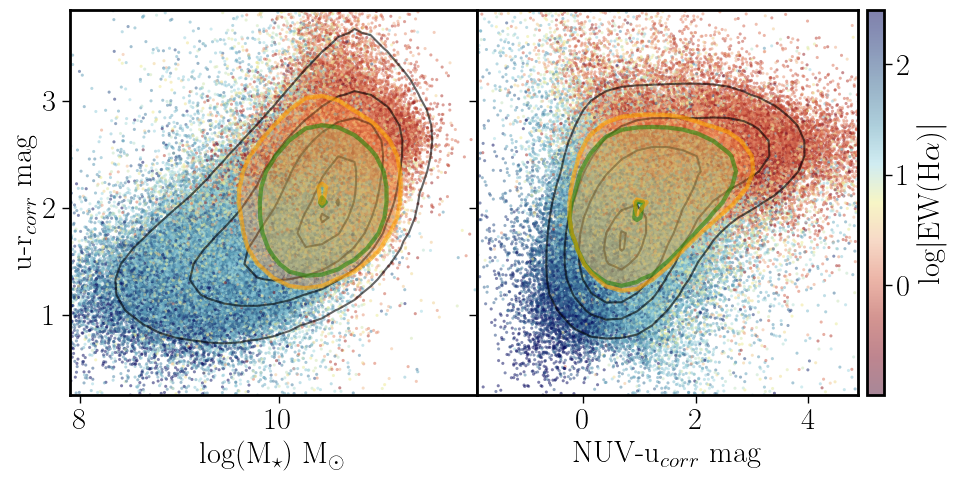

In [151]:
#
#
#
fig, axes = plt.subplots(1,2,figsize=(10.5,5), sharey=True, squeeze=False)

x_min1 = 7.9
x_max1 = 11.99
x_min2 = -1.9
x_max2 = 4.9
y_min = 0.25
y_max = 3.85

cm = vel_map().reversed()
x=np.linspace(2*x_min1,2*x_max1,100)

s = 5
alpha = 0.5
#c_agn = 'black'
c_early='#ff9700'
c_agn='#000080'
c_late='blue'
#'#7bff7b'

plot_all = 1

X1 = np.log10(tab_nsa_mpa['ELPETRO_MASS']/(0.71**2))
X2 = tab_nsa_mpa['CORR_MAG'][:,1]-tab_nsa_mpa['CORR_MAG'][:,2]
Y = tab_nsa_mpa['CORR_MAG'][:,2]-tab_nsa_mpa['CORR_MAG'][:,4]
C = log_EW_Ha

if (plot_all==1):
    cax=axes[0,0].scatter(X1[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')
    cax=axes[0,1].scatter(X2[mask_Ha & mask_z],Y[mask_Ha & mask_z],c=C[mask_Ha & mask_z], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')

my_contour(axes[0,0],X1[mask_Ha],Y[mask_Ha],x_min1,x_max1,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
#           conts=[0.95,0.5,0.2,0.01])
                   conts=conts)

my_contour(axes[0,1],X2[mask_Ha],Y[mask_Ha],x_min2,x_max2,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=conts)

axes[0,0].set_ylabel(r'u-r$_{corr}$ mag')
axes[0,0].set_xlabel(r'log(M$_\star$) M$_\odot$')
axes[0,1].set_xlabel(r'NUV-u$_{corr}$ mag')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min2,x_max2)
axes[0,0].set_ylim(y_min,y_max)
axes[0,1].set_ylim(y_min,y_max)




plt.subplots_adjust(wspace=0)

my_contourf(axes[0,0],X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='green',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Greens')

my_contourf(axes[0,0],X1[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='orange',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Oranges')


my_contourf(axes[0,1],X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='green',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Greens')

my_contourf(axes[0,1],X2[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='orange',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01],cmap='Oranges')


my_contour(axes[0,0],X1[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='green',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,0],X1[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min1,x_max1,y_min,y_max,c_color='orange',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])


my_contour(axes[0,1],X2[mask_AGNs_WHaD & mask_z],Y[mask_AGNs_WHaD & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='green',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

my_contour(axes[0,1],X2[mask_AGNs_N2_EW & mask_z],Y[mask_AGNs_N2_EW & mask_z],\
           x_min2,x_max2,y_min,y_max,c_color='orange',\
            nbins=25,title='',linewidths=3,alpha=0.35,\
                   conts=[0.9,0.01])

#my_contour(axes[0,1],X2[mask_SF_WHaD & mask_z],Y[mask_SF_WHaD & mask_z],\
#           x_min2,x_max2,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

s_XMM = (np.log10(np.array(tab_nsa_mpa['L_HX']))/40-1)*2000 #*3000

#cax = axes[0,0].scatter(X1[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')

#cax = axes[0,1].scatter(X2[mask_Ha_XMM & mask_z],Y[mask_Ha_XMM & mask_z],\
#                        c=C[mask_Ha_XMM & mask_z], marker='*',\
#                  s=s_XMM[mask_Ha_XMM & mask_z],\
#                  alpha=0.75, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='k')



cb=add_colorbar(cax, aspect=12)
cb.set_label(r'log$\rm |EW(H\alpha)|$')


out_dir='figs'
out_fig=out_dir+'/nsa_mpa_OAGNs_N2_EW_WHaD.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")


#X1

In [48]:
print(len(tab_nsa_mpa[mask_Ha_XMM]))

248


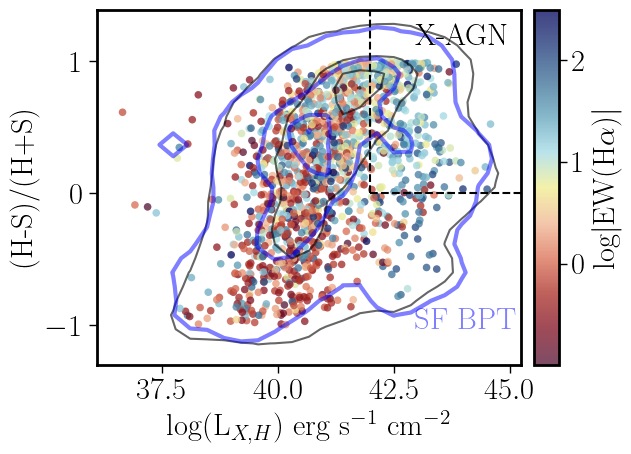

In [49]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'
x_min=36.1
x_max=45.25
y_min=-1.3
y_max=1.39


alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = np.log10(tab_nsa_mpa['L_HX'])
Y = tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


my_contour(ax,X[mask_SF & mask_HR],Y[mask_SF & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=[0.95,0.5,0.2,0.01])

ax.text(x_max-0.25*np.abs(x_max-x_min),y_min+0.1*np.abs(y_max-y_min),'SF BPT',color=c_late,alpha=0.5)


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR],color='None',\
#           marker='o', s=s, alpha=0.75,rasterized=True,edgecolor='k')

ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'log(L$_{X,H}$) erg s$^{-1}$ cm$^{-2}$')
ax.set_ylabel(r'(H-S)/(H+S)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=5)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_LHX_HR.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




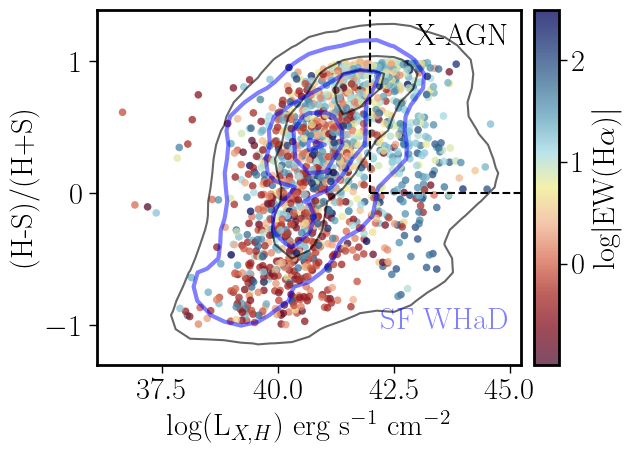

In [50]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'

x_min=36.1
x_max=45.25
y_min=-1.3
y_max=1.39

#x_min=36.1
#x_max=44.45
#y_min=-1.15
#y_max=1.19


alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = np.log10(tab_nsa_mpa['L_HX'])
Y = tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=[0.95,0.5,0.2,0.01])

ax.text(x_max-0.33*np.abs(x_max-x_min),y_min+0.10*np.abs(y_max-y_min),'SF WHaD',color=c_late,alpha=0.5)

#my_contour(ax,X[mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_agn,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR],color='None',\
#           marker='o', s=s, alpha=0.75,rasterized=True,edgecolor='k')

ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'log(L$_{X,H}$) erg s$^{-1}$ cm$^{-2}$')
ax.set_ylabel(r'(H-S)/(H+S)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=5)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_LHX_HR_WHaD.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




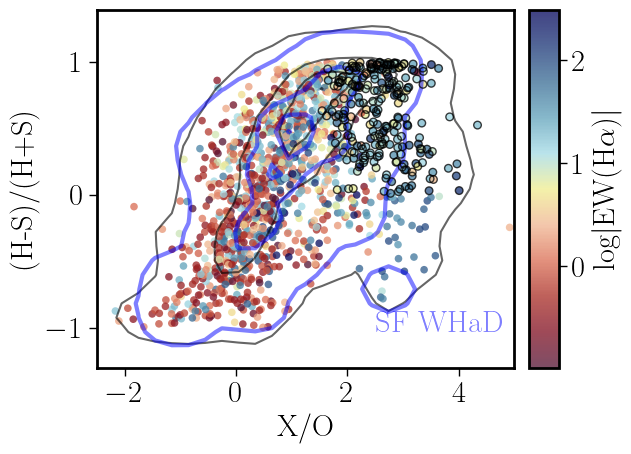

In [51]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'
x_min=-2.5
x_max=4.99
y_min=-1.3
y_max=1.39


#x_min=36.1
#x_max=45.25
#y_min=-1.3
#y_max=1.39

alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = tab_nsa_mpa['X_O']
Y = tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=[0.95,0.5,0.2,0.01])

ax.text(x_max-0.33*np.abs(x_max-x_min),y_min+0.10*np.abs(y_max-y_min),'SF WHaD',color=c_late,alpha=0.5)

#my_contour(ax,X[mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_agn,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR],color='None',\
           marker='o', s=s, alpha=0.75,rasterized=True,edgecolor='k')

#ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
#ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

#ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'X/O')
ax.set_ylabel(r'(H-S)/(H+S)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=5)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XO_HR_WHaD.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




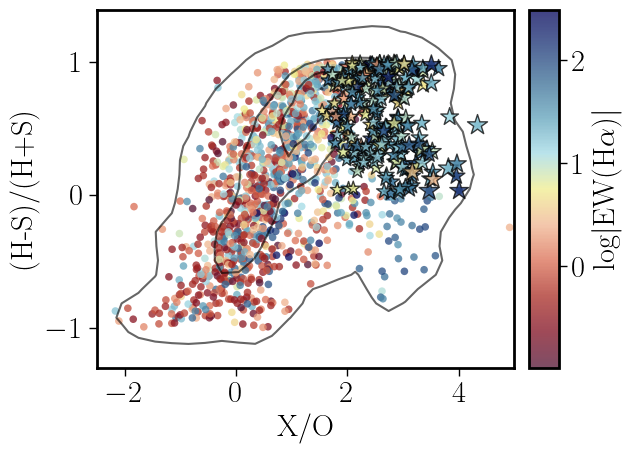

In [52]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'
x_min=-2.5
x_max=4.99
y_min=-1.3
y_max=1.39


#x_min=36.1
#x_max=45.25
#y_min=-1.3
#y_max=1.39

alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = tab_nsa_mpa['X_O']
Y = tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

#ax.text(x_max-0.33*np.abs(x_max-x_min),y_min+0.10*np.abs(y_max-y_min),'SF WHaD',color=c_late,alpha=0.5)

#my_contour(ax,X[mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_agn,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR], c=C[mask_Ha_XMM & mask_HR],\
           alpha=alpha, cmap=cm, vmin=l_EW_min,\
           vmax=l_EW_max,rasterized=True,\
           marker='*', s=s_XMM[mask_Ha_XMM],edgecolor='k')

#ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
#ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

#ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'X/O')
ax.set_ylabel(r'(H-S)/(H+S)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=5)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XO_HR_WHaD.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




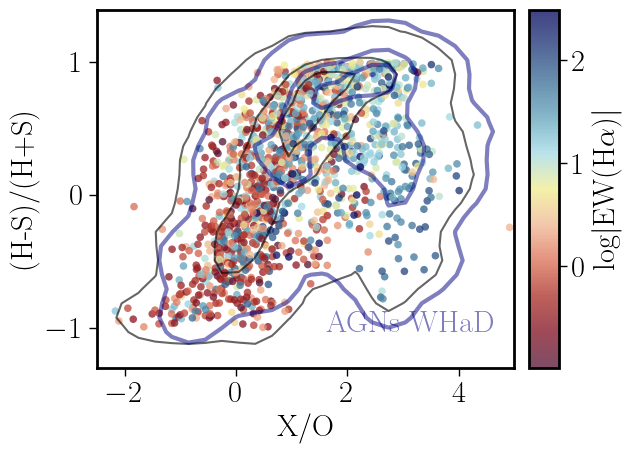

In [53]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'

x_min=-2.5
x_max=4.99
y_min=-1.3
y_max=1.39

alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = tab_nsa_mpa['X_O']
Y = tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


my_contour(ax,X[mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_agn,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=[0.95,0.5,0.2,0.01])

ax.text(x_max-0.45*np.abs(x_max-x_min),y_min+0.10*np.abs(y_max-y_min),'AGNs WHaD',color=c_agn,alpha=0.5)

#my_contour(ax,X[mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_agn,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])

#,c=C[mask_HR]
#my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & m alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,ask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR],color='None',\
#           marker='o', s=s, alpha=0.75,rasterized=True,edgecolor='k')

#ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
#ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

#ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'X/O')
ax.set_ylabel(r'(H-S)/(H+S)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=5)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XO_HR_WHaD_AGNs.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




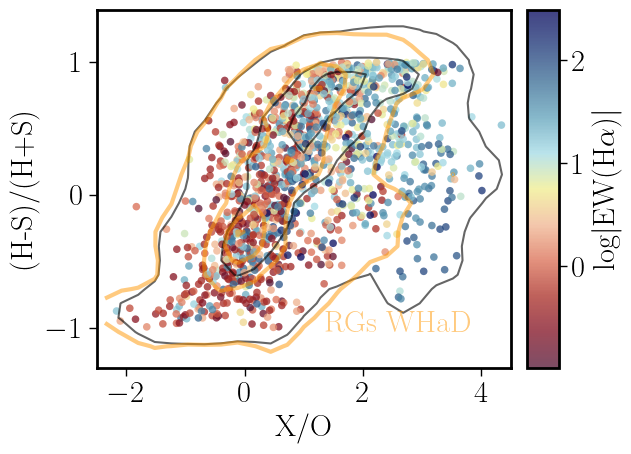

In [54]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'

x_min=-2.5
x_max=4.5
y_min=-1.3
y_max=1.39




alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = tab_nsa_mpa['X_O']
Y = tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=[0.95,0.5,0.2,0.01])

ax.text(x_max-0.45*np.abs(x_max-x_min),y_min+0.10*np.abs(y_max-y_min),'RGs WHaD',color=c_early,alpha=0.5)

#my_contour(ax,X[mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_agn,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR],color='None',\
#           marker='o', s=s, alpha=0.75,rasterized=True,edgecolor='k')

#ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
#ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

#ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'X/O')
ax.set_ylabel(r'(H-S)/(H+S)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=5)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_XO_HR_WHaD_AGNs.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




In [55]:
print(X[mask_Ha_XMM])
#print(X[print(len(tab_nsa_mpa[mask_Ha_XMM]))mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR])

       X_O        
------------------
2.9788320064544678
 2.840242385864258
 3.839862585067749
 3.367130994796753
1.9568264484405518
               ...
2.4698684215545654
3.5099616050720215
3.9710025787353516
2.9462599754333496
3.3389339447021484
2.6183176040649414
Length = 248 rows


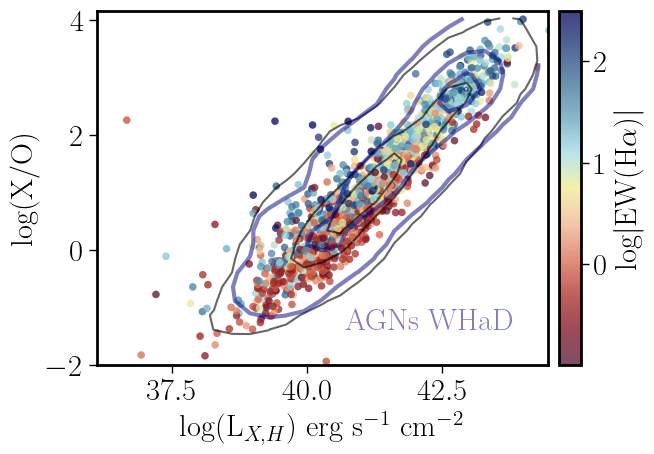

In [56]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'
x_min=36.1
x_max=44.45
y_min=-2
y_max=4.15

#y_min=-1.15
#y_max=1.19


alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = np.log10(tab_nsa_mpa['L_HX'])
Y = tab_nsa_mpa['X_O']#tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])



my_contour(ax,X[mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_agn,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=[0.95,0.5,0.2,0.01])

ax.text(x_max-0.45*np.abs(x_max-x_min),y_min+0.10*np.abs(y_max-y_min),'AGNs WHaD',color=c_agn,alpha=0.5)


#my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR],color='None',\
#           marker='o', s=s, alpha=0.75,rasterized=True,edgecolor='k')

#ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
#ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

#ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'log(L$_{X,H}$) erg s$^{-1}$ cm$^{-2}$')
ax.set_ylabel(r'log(X/O)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=15)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_LHX_OX_WHaD_AGNs.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




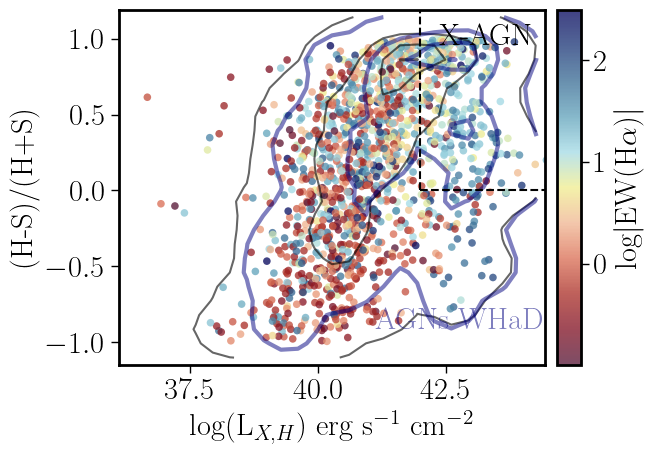

In [57]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'
x_min=36.1
x_max=44.45
y_min=-1.15
y_max=1.19


alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = np.log10(tab_nsa_mpa['L_HX'])
Y = tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])



my_contour(ax,X[mask_AGNs_WHaD & mask_HR],Y[mask_AGNs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_agn,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=[0.95,0.5,0.2,0.01])

ax.text(x_max-0.4*np.abs(x_max-x_min),y_min+0.10*np.abs(y_max-y_min),'AGNs WHaD',color=c_agn,alpha=0.5)


#my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR],color='None',\
#           marker='o', s=s, alpha=0.75,rasterized=True,edgecolor='k')

ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'log(L$_{X,H}$) erg s$^{-1}$ cm$^{-2}$')
ax.set_ylabel(r'(H-S)/(H+S)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=5)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_LHX_HR_WHaD_AGNs.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




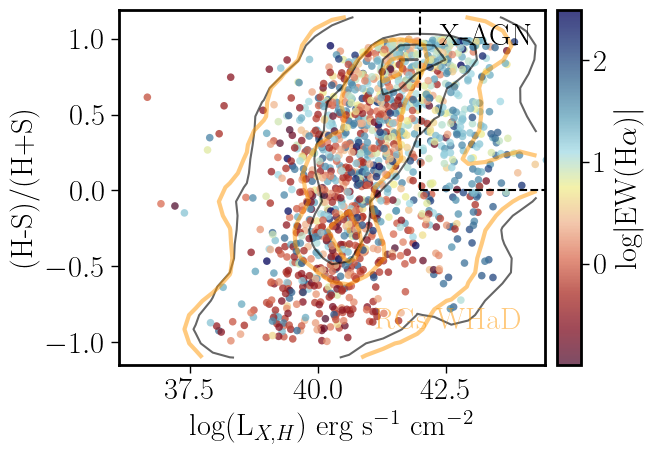

In [58]:
#
#
#
fig, ax = plt.subplots(figsize=(7,5))


c_early='#ff9700'
c_agn='#000080'
#c_late='#7bff7b'
#c_agn='black'

c_SF=c_late#'grey'
c_RG=c_early
c_sAGN=c_agn#'blue'
c_wAGN='#0080ff'#'cyan'
x_min=36.1
x_max=44.45
y_min=-1.15
y_max=1.19


alpha=0.75
size=50
s=30

ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)
#cm = 'terrain'
#cm = 'gist_earth'
#cm = 'viridis'
#cm = 'jet'
#cm = 'cividis'
cm = vel_map().reversed()

mask_HR = (tab_nsa_mpa['HR']<1.0)
X = np.log10(tab_nsa_mpa['L_HX'])
Y = tab_nsa_mpa['HR']
C = np.log10(np.abs(tab_nsa_mpa['H_ALPHA_EQW']))

plot_all = 1
if (plot_all==1):
    cax=ax.scatter(X[mask_HR],Y[mask_HR],c=C[mask_HR], marker='o', s=s, alpha=alpha, cmap=cm, vmin=l_EW_min, vmax=l_EW_max,rasterized=True,edgecolor='None')


my_contour(ax,X[mask_Ha & mask_HR],Y[mask_Ha & mask_HR],x_min,x_max,y_min,y_max,c_color='k',\
            nbins=25,title='',linewidths=1.5,alpha=0.6,\
                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])



my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
            nbins=25,title='',linewidths=3,alpha=0.5,\
                   conts=[0.95,0.5,0.2,0.01])

ax.text(x_max-0.4*np.abs(x_max-x_min),y_min+0.10*np.abs(y_max-y_min),'RGs WHaD',color=c_early,alpha=0.5)


#my_contour(ax,X[mask_RGs_WHaD & mask_HR],Y[mask_RGs_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_early,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#my_contour(ax,X[mask_SF_WHaD & mask_HR],Y[mask_SF_WHaD & mask_HR],x_min,x_max,y_min,y_max,c_color=c_late,\
#            nbins=25,title='',linewidths=3,alpha=0.5,\
#                   conts=[0.95,0.5,0.2,0.01])


#ax.scatter(X[mask_Ha_XMM & mask_HR],Y[mask_Ha_XMM & mask_HR],color='None',\
#           marker='o', s=s, alpha=0.75,rasterized=True,edgecolor='k')

ax.plot([LX_lim,x_max],[HR_lim,HR_lim],'--',c='black')
ax.plot([LX_lim,LX_lim],[HR_lim,y_max],'--',c='black')

ax.text(x_max-0.25*np.abs(x_max-x_min),y_max-0.1*np.abs(y_max-y_min),'X-AGN')

ax.set_xlabel(r'log(L$_{X,H}$) erg s$^{-1}$ cm$^{-2}$')
ax.set_ylabel(r'(H-S)/(H+S)')
ax.set_xlim(x_min,x_max)
ax.set_ylim(y_min,y_max)

cb=add_colorbar(cax,aspect=5)
#cb.set_label(r'log([NII]/H$\alpha$)')
cb.set_label(r'log$\rm |EW(H\alpha)|$')

plt.tight_layout()
out_dir='figs'
out_fig=out_dir+'/nsa_mpa_LHX_HR_WHaD_RGs.pdf'
if (plot_all==1):
    fig.savefig(out_fig, transparent=False, facecolor='white', edgecolor='white')#.pdf")

        #    plt.setp(ax[1], ylim=ax[0].get_ylim())   




In [59]:
#mask_HR = (tab_nsa_mpa_XMM['HR']<1.0)

#plt.scatter(np.log10(tab_nsa_mpa_XMM['L_HX'][mask_HR]),tab_nsa_mpa_XMM['HR'][mask_HR])

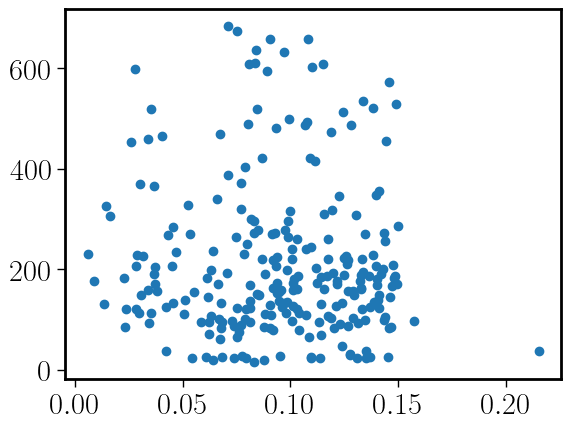

In [60]:
plt.scatter(REDSHIFT[mask_Ha_XMM], disp_Ha[mask_Ha_XMM])